# Spektroheliographie

Fortgeschrittenenpraktikum Physik Universität Konstanz

Name: Moritz Schröer

Betreuer: Ralf Bausinger

Versuchsdurchführung: 15.07.2024

# Imports und Funktionen

Aufgrund der großen Dateigröße (über 120 MB für Bilder) wurden die Abbildungen nicht zusätzlich hochgeladen. Daher wird dieses Notebook bei einer erneuten Ausführung einzelner Zellen nicht korrekt funktionieren, wenn die Abbildungen nicht in einem separaten Ordner namens "Abbildungen" im gleichen Verzeichnis wie das Notebook gespeichert werden.

(Wenn das Notebook neu ausgeführt werden soll, kann man die Bilder und das ipynb file von https://github.com/moritzschroer/FP_Auswertung_Spektroheliographie.git unter Code -> Download ZIP herunterladen, dann das Archiv entpacken, den Ordner in 'Abbildungen' umbenennen und das ipynb file in den übergeordneten Ordner verschieben.)

## Imports

In diesem Notebook werden verschiedene Bibliotheken verwendet: cv2 für die Bildverarbeitung, matplotlib für die grafische Darstellung, numpy und pandas für die Datenmanipulation sowie scipy für Kurvenanpassung und Voigt-Profile.

Zusätzlich werden AVI-Dateien verwendet, die mit dem Programm $\texttt{SerPlayer}$ aus SER-Sequenzen erstellt wurden, sowie Abbildungen, die mit dem Programm $\texttt{Sol'Ex}$ erstellt und anschließend mit $\texttt{GIMP}$ bearbeitet wurden. 

In [537]:
import cv2
import sys
import matplotlib.pyplot as plt
import numpy as np
from scipy.special import voigt_profile
from scipy.optimize import curve_fit
import matplotlib.image as mpimg
import pandas as pd

## Funktionen
Dieser Abschnitt beinhaltet ein paar Funktionen, die im Verlauf des Notebooks mehrmals verwendet werden.

In [538]:
# Die Funktion 'extract_single_frame' kann aus einem avi video, welches aus dem .ser file erstellt wurde ein einzelnes Frame extrahieren und zurückgeben
def extract_single_frame(params):
    # öffne das file, welches unter 'avi_file_path' zu finden ist
    cap = cv2.VideoCapture(params['file_path']+'.avi')
    if not cap.isOpened():
        print(f"Fehler beim Öffnen der Datei {params['file_path']}")
        sys.exit()
    else:
        # extrahiere das Frame, an Position 'frame_index' des avi files, und gebe die schwarz/weiß Werte der Pixel als array
        cap.set(cv2.CAP_PROP_POS_FRAMES, params['frame_index'])
        ret, frame = cap.read()
        if ret:
            return cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        else:
            print(f"Fehler beim Lesen des Frames bei Index {params['frame_index']}")
            cap.release()
            sys.exit()

# Die Funktion 'get_average_spectrum' berechnet das gemittelte Spektrum eines arrays, aus den Schwarz/weiß Werten eines Images.
# Dabei bei einer bestimmeten x-Position 'x_value' auf dem Frame entlang der y-Achse die Pixelwerte in einem array gespeichert. 
# Dabei werden die Pixelwerte zu einem y-Wert in x-Richtung über einen Bereich von ['x_value'  - 'range_averaging', 'x_value'  - 'range_averaging']
# gemittelt.
def get_spectrum(image, params):
    if params['range_averaging'] >= 1:
        return image[:, params['x_value'] - params['range_averaging']:params['x_value'] + params['range_averaging']].mean(axis=1)
    else:
        return image[:, params['x_value'] ]

In [539]:
# Die Funktion 'plot_spectrum' plottet den Bildabschnitt, aus dem das Spektrum entnommen wird und das gemittelte Spektrum. 
# Der x-Wert, um den das Spektrum gemittelt wurde, ist dabei in dem Bildabschnitt durch eine rote vertikale Linie gekennzeichnet.
def plot_spectrum(average_spectrum, image, params_spectrum):            

    plt.figure(figsize=(12, 6))
            
    plt.subplot(1, 2, 1)
    plt.plot(average_spectrum, color='red')
    plt.xlabel('y [Pixel]')
    plt.ylabel('Intensität in arb. unit')
    plt.title('Intensität in arb. unit entlang der y-Achse bei x='+str(params_spectrum['x_value'])+ ', frame Nr. ' + str(params_spectrum['frame_index']))
    plt.xlim(3,len(average_spectrum) )
    plt.grid()

    ax = plt.subplot(1, 2, 2)
    plt.imshow(image[:, params_spectrum['x_value'] - params_spectrum['range_plot_image']:params_spectrum['x_value'] + params_spectrum['range_plot_image'] + 1], cmap='gray')
    plt.axvline(x=params_spectrum['range_plot_image'], color='red', linestyle='--')
    plt.xlim(0,2*params_spectrum['range_plot_image'])
    x_ticks = np.linspace(0, 2*params_spectrum['range_plot_image'], num=5)
    x_labels = [f"{params_spectrum['x_value'] - params_spectrum['range_plot_image'] + tick }" for tick in x_ticks]

    plt.xlabel('X')
    plt.ylabel('Y')

    plt.tight_layout()
    plt.show()

In [540]:
# Die Funktion 'plot_fit_function' plottet das gemittelte Spektrum und die gefittete Funktion
def plot_fit_function(ax,left_lim, right_lim, fit_function, popt, average_profile, params_spectrum, label_spectrum = None, label_fit = None, color_spectrum = 'red', color_fit = 'blue'):
     
     ax.plot(range(len(average_profile)) ,average_profile, color=color_spectrum, label = label_spectrum)

     ax.plot(np.linspace(left_lim, right_lim, 200), fit_function(np.linspace(left_lim, right_lim, 200),*popt), linestyle ='--', label = label_fit, color = color_fit)
     ax.set_xlim(3,len(average_profile) - 3)
     
     ax.set_xlabel('y [Pixel]')
     ax.set_ylabel('Intensität arb. unit')
     ax.set_title('intensität in arb. unit entlang der Y-Achse bei x='+str(params_spectrum['x_value'])+ ', frame Nr. ' + str(params_spectrum['frame_index']))
     ax.grid()

     return ax

### Fit Funktionen der Absorptionslinien

Die Absorptionslinen sollen mit Hilfe von Voigt-Profilen gefittet werden, um die Positionen der Intensitätsminima der Absorptionslinen zu bestimmen. Ein Voigt-Profil ist die Faltung einer Gauß-Kurve an einer Lorenz-Kurve: 

$V(\lambda, \sigma, \gamma, \lambda_0)=\int G(\lambda'-\lambda_0,\sigma)\cdot L(\lambda - \lambda', \gamma) d\lambda'$

Da mehrere Absoprptionslinen sich teilweise überlappen können, sollen auch Summen von mehreren Voigt Profilen mit mehreren Wellenlängen $\lambda_0$ betrachtet werden. Da Absorptionslinien betrachtet werden sollen, wird dabei das Voigt-Profil von einer Basis intensität $\rm{I}_0$ abgezogen. Die Funktion zur Beschreibung des Spektrums wird dann beschrieben durch:

$\rm{I}_{\rm{fit}}(\lambda)=\rm{I}_0-\sum\limits_{k} \rm{I}_{\rm{k}}\cdot V(\lambda, \sigma_k, \gamma_k, \lambda_{0,k})$,

wobei die Parameter $\rm{I}_0$, $\rm{I}_{\rm{k}}$, $\sigma_{\rm{k}}$, $\gamma_{\rm{k}}$ mit Hilfe eines least squares fits an ein aufgezeichnetes Spektrum ermittelt werden.

In [541]:
# Die Funktion 'single_voigt_profile' gibt ein Voigt-Profil zurück, mit den gegebenen Parameter ab. 
def single_voigt_profile(λ, λ_0, γ, σ ,amplitude):
        #z = ((λ - λ_0) + 1j * γ) / (σ * np.sqrt(2))
        #voigt = np.real(wofz(z)) / (σ * np.sqrt(2 * np.pi))
        voigt = voigt_profile(λ-λ_0,σ, γ)
        return amplitude * voigt

# Da mit den Voigt-Profile Absorptionslinien gefittet werden sollen, gibt die Funktion dabei ein Voigt-Profil zurück, welches von einer Basisintensität abgezogen wurde. 
# Dabei kann die folgende Funktion die Summe von mehreren Voigt-Profilen berechnen.
def generate_voigt_sum_function(num_profiles):
    def voigt_sum_function(λ, *params):
        result = np.zeros_like(λ)
        for i in range(num_profiles):
            λ_0, γ, σ, amplitude = params[i*4:(i+1)*4]
            result += single_voigt_profile(λ, λ_0, γ, σ, amplitude)
        intensity_base = params[-1]
        return intensity_base - result
    return voigt_sum_function

In [542]:
def thirt_order_polynomial(x,params):
    return params[0]*x**3+params[1]*x**2+params[2]*x+params[3]

# Sonne Aufnahmen im Kontinuum

In diesem Versuch wurde ein Aufbau mit einem Sol'Ex Spektroskop verwendet. Der Versuchsaufbau und eine Beschreibung von verschiedenen Messmethoden ist unter http://www.astrosurf.com/solex/sol-ex-observation-en.html zu finden. 

In diesem Versuch wurden Bildsequenzen der Sonne in drei verschiedenen Wellenlängenbereichen aufgenommen. Der erste Bereich umfasst die $\text{H}_{\alpha}$-Linie der Balmerserie des Wasserstoffs bei 6562,81 A, der zweite deckt die Calcium-Linie bei 3933,66 A ab, und der dritte Bereich konzentriert sich auf die beiden Eisenlinien bei 6301,5 A und 6302,5 A.

Zunächst sollen Aufnahmen im Kontinuum betrachtet werden. Dazu wird eine Wellenlänge gewählt, die nicht genau auf einer der Absorptionslinien liegt, sondern leicht verschoben ist, sodass sie sich nicht mehr im Absorptionsminimum, sondern im Bereich des kontinuierlichen Spektrums befindet. In den folgenden Abbildungen sind die Kontinuumaufnahmen zu sehen.

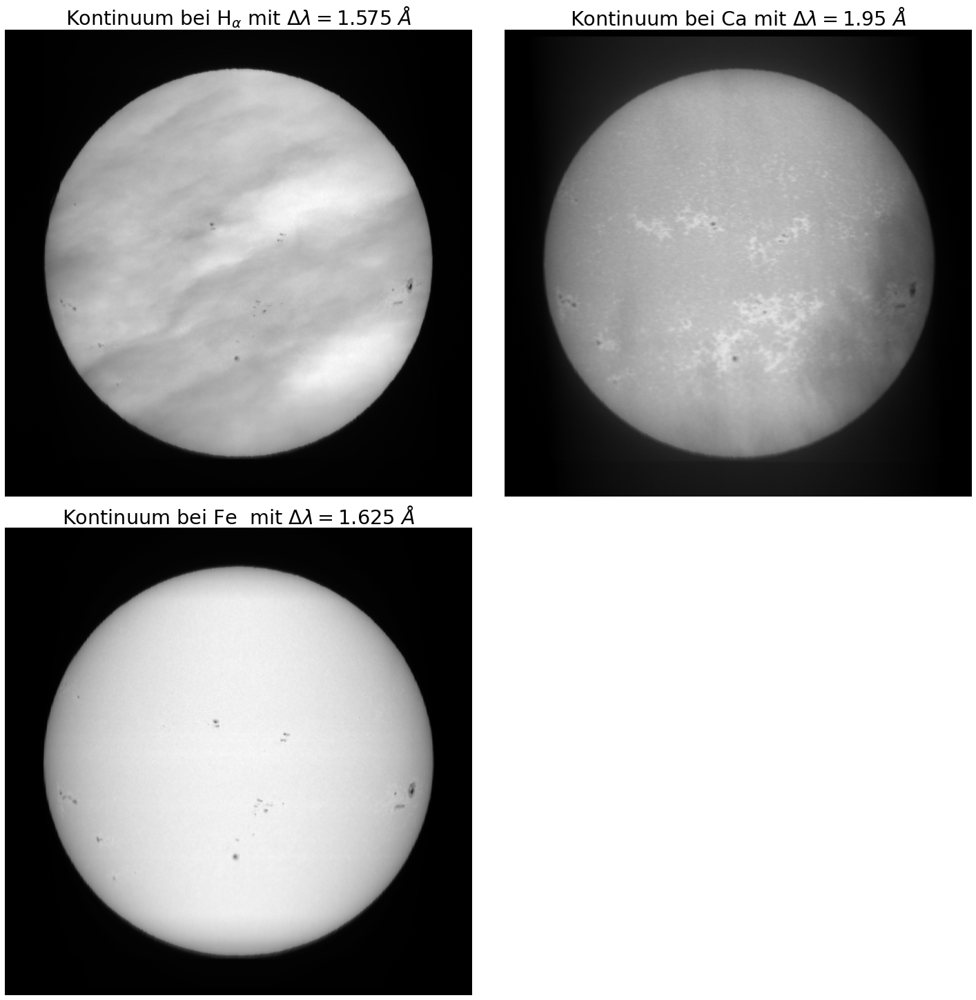

In [543]:
filenames = ['H_alpha', 'Ca', 'Fe']
titles = ['Kontinuum bei H$_{\\alpha}$ mit $\\Delta\\lambda = 1.575$ $\AA$', 'Kontinuum bei Ca mit $\\Delta\\lambda = 1.95$ $\AA$', 'Kontinuum bei Fe  mit $\\Delta\\lambda = 1.625$ $\AA$']

plt.figure(constrained_layout=True,figsize=(20, 20))
for i in range(3):
    image = cv2.imread('Abbildungen/Kontinuum'+filenames[i]+'.png', cv2.IMREAD_GRAYSCALE)
    plt.subplot(2, 2, i+1)
    plt.imshow(image, cmap = 'gray')
    plt.title(titles[i])
    plt.axis('off')

In den Kontinuumspektren lassen sich verschiedene Strukturen auf der Sonnenoberfläche erkennen. Zum einen sind Sonnenflecken sichtbar, die in einem späteren Abschnitt des Notebooks genauer betrachtet werden. In der Kontinuumsaufnahme nahe der $\text{H}_{\alpha}$-Linie sind zudem Störungen durch Wolken erkennbar, da der Himmel zum Zeitpunkt der Aufnahme nicht völlig klar war. In der Aufnahme des Kontinuums nahe der Calcium-Linie sind neben den dunklen Sonnenflecken auch helle Sonnenfackeln sichtbar, die ebenfalls in einem späteren Abschnitt behandelt werden. Insgesamt unterscheiden sich die Kontinuumsspektren zwar leicht voneinander, doch liefert das Kontinuum für alle betrachteten Wellenlängen ein weitgehend ähnliches Bild.

# Strukturen auf der Sonnenoberfläche

## $\text{H}_{\alpha}$-Linie

In diesem Abschnitt werden nun als erstes Strukture auf der Sonnenoberfläche betrachtet. Dafür wird nun eine Aufnahme der Sonne bei der $\rm{H}_{\alpha}$-Linie der Balmerserie des Wasserstoffs betrachtet.

(-0.5, 3119.5, 3119.5, -0.5)

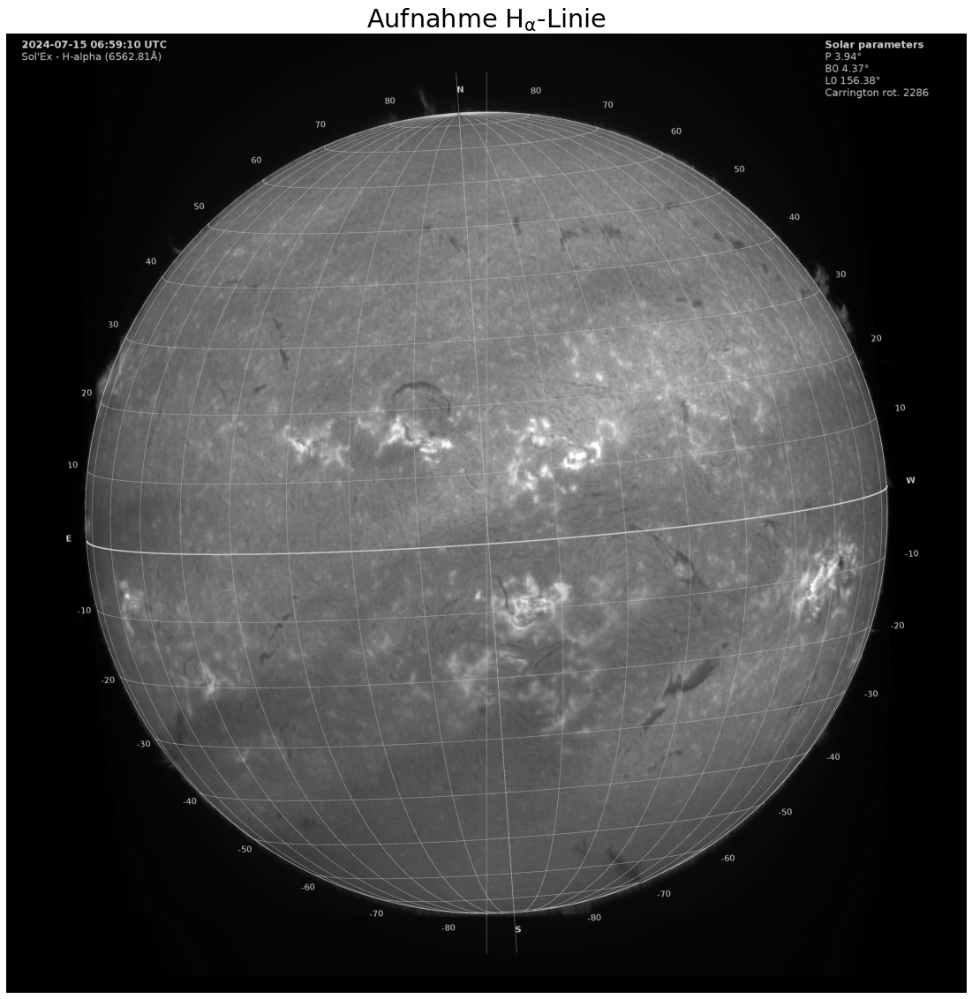

In [544]:
plt.rcParams.update({'font.size': 24})

sun_image = cv2.imread('Abbildungen/AufnahmeHAlphaLinie.png', cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=(20, 20))

plt.imshow(sun_image, cmap = 'gray')
plt.title('Aufnahme $\\rm{H}_{\\alpha}$-Linie')
plt.axis('off')


Ale erstes sollen nun Protuberanzen betrachtet werden. Protuberanzen sind große, leuchtende Strukturen, die sich aus der Sonnenoberfläche heraus erstrecken und in die Korona der Sonne ragen. Sie bestehen aus dichtem Plasma, das kühler ist als die umgebende Korona. Diese Erscheinungen sind eng mit dem Magnetfeld der Sonne verbunden und können für Tage oder Wochen stabil bleiben. Protuberanzen entstehen durch magnetische Rekonnexionen in der Chromosphäre der Sonne, bei denen sich magnetische Feldlinien aus dem komplexen Sonnenmagnetfeld herauswinden und dabei Plasma mit sich ziehen.
Man erkennt auf der Aufnahme mehrere Protuberanzen. Zwei der deutlich erkennbaren Protuberanzen sollen nun genauer betracchtet werden. Zum einen die Protuberanz am Westrand der Sonne bei $30^\circ$ nördlicher Breite im folgenden als Protuberanz 1 bezeichnet, zum anderen die Protuberanz unmittelbar östlich des Nordpols im folgenden als Protuberanz 2 bezeichnet.

(-0.5, 338.5, 341.5, -0.5)

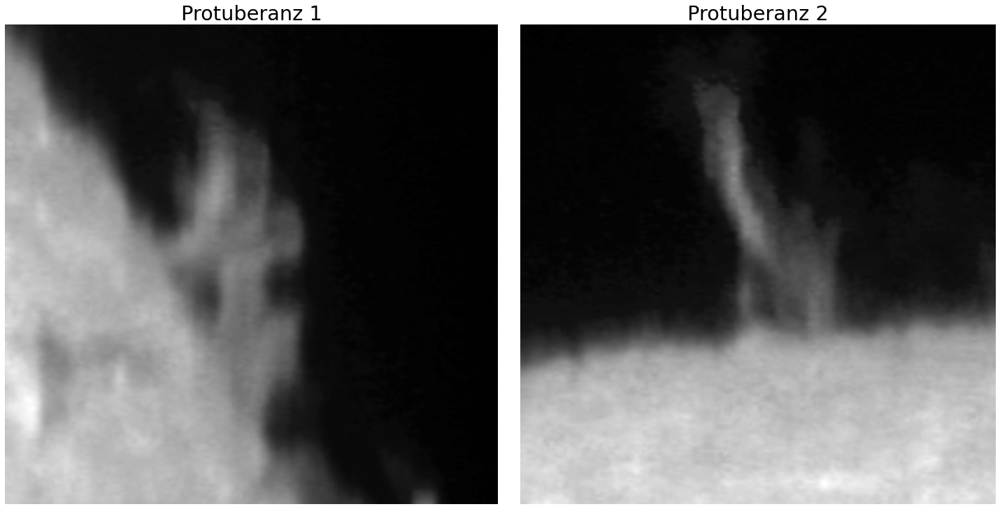

In [545]:
Protuberanz1 = cv2.imread('Abbildungen/Protuberanz1.png', cv2.IMREAD_GRAYSCALE)
Protuberanz2 = cv2.imread('Abbildungen/Protuberanz2.png', cv2.IMREAD_GRAYSCALE)

plt.figure(constrained_layout=True,figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.imshow(Protuberanz1, cmap = 'gray')
plt.title('Protuberanz 1')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(Protuberanz2, cmap = 'gray')
plt.title('Protuberanz 2')
plt.axis('off')

Nun soll die Höhe der Protuberanzen abgeschätzt werden. Dazu wird zunächst die Höhe der Protuberanz in Pixeln gemessen und anschließend mit der Größe pro Pixel in Kilometern am Sonnenrand multipliziert. Die Größe eines Pixels in Kilometern wird anhand des Durchmessers der Sonne in Kilometern und der Anzahl der Pixel im Bild bestimmt. Da das Ablesen des Sonnenrands nur mit einer Genauigkeit von $\pm 3$ Pixeln erfolgt, ergibt sich eine kombinierte Unsicherheit für den Pixeldurchmesser:

 $\text{d}_{\rm{Pixel}} = \frac{\text{d}_{\text{Sonne in Pixel}}}{\text{d}_{\text{Sonne in km}}} = 534.0 \pm 0.9 \frac{\text{ km}}{\text{Pixel}}$.

Für die beiden Protuberanzen ergibt die Abschätzung Höhen von:
$$
\begin{array}{|c|c|c|}
\hline
\text{Protuberanz}& \text{Protuberanz 1} & \text{Protuberanz 2}  \\
\hline
\text{Höhe} & 29970 \pm 1776 \text{ km} & 47186 \pm 1972 \text{ km} \\
\hline
\end{array}
$$.

Diese Höhenangaben beziehen sich auf die Entfernung der Protuberanzen über dem sichtbaren Sonnenrand. Um die tatsächliche Höhe über der Sonnenoberfläche zu berechnen, wären zusätzliche Aufnahmen aus verschiedenen Winkeln erforderlich, um die exakte Richtung zu bestimmen, in der die Protuberanzen von der Sonnenoberfläche weg ragen.

Neben den Protuberanzen sind in der Aufnahme zur $\text{H}_{\alpha}$-Linie auch mehrere Filamente zu sehen. Filamente sind Protuberanzen in der Draufsicht. Sie erscheinen aufgrund des im Vergleich zur umgebenden Korona deutlich kälteren, in die Korona ragenden Plasmas als dunkle, oft bogenförmige Strukturen auf der Sonnenoberfläche. In der Abbildung der Sonne in der $\text{H}_{\alpha}$-Linie sind beispielsweise bei $25^\circ$ nördlicher Breite und $10^\circ$ östlicher Länge ein Filament, im Folgenden als Filament 1 bezeichnet, sowie bei $-25^\circ$ südlicher Breite und $30^\circ$ westlicher Länge ein weiteres Filament, im Folgenden als Filament 2 bezeichnet, zu erkennen.

(-0.5, 262.5, 263.5, -0.5)

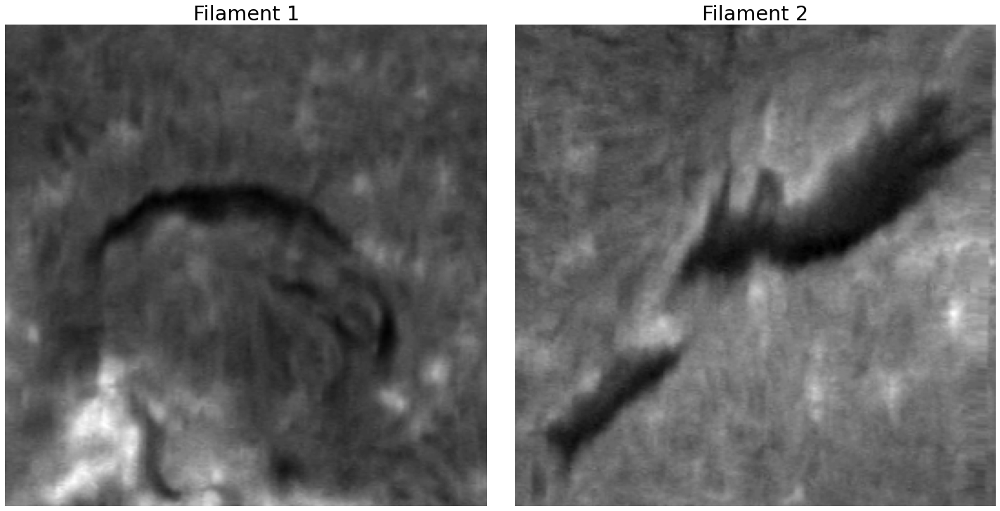

In [546]:
Filament1 = cv2.imread('Abbildungen/Filament1.png', cv2.IMREAD_GRAYSCALE)
Filament2 = cv2.imread('Abbildungen/Filament2.png', cv2.IMREAD_GRAYSCALE)

plt.figure(constrained_layout=True,figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.imshow(Filament1, cmap = 'gray')
plt.title('Filament 1')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(Filament2, cmap = 'gray')
plt.title('Filament 2')
plt.axis('off')

Für die Filamente kann man die Größe berechnen dafür werden auf der Karte der Sonne die Koordinaten $(\theta_1,\phi_1)$ und $(\theta_2,\phi_2)$ der Endpunkte der Filamente bestimmt, wobei $\theta$ die Höhenwinkel und $\phi$ die  Azimutwinkel sind.  Mit Hilfe dieser Winkel kann dann mit Hilfe des bekannten Sonnenradius $\text{r}_{\text{Sonne}}$ der Abstand der beiden Punkte, also die Größe der Filamente berechnet werden:

$\text{d}_{12} = \text{arccos}(\text{sin}(\theta_1)\cdot\text{sin}(\theta_2)+\text{cos}(\theta_1)\cdot \text{cos}(\theta_2)\cdot \text{cos}(\phi_2-\phi_1))\cdot 2\pi \text{r}_{\text{Sonne}}$

Bei Ablesen der Winkel gibt es eine Ungenauigkeit von ca. $0,5^\circ$ mit der Gleichung für die Winkelberechnung lässt sich damit eine kombinierte Messunsichereheit berechnen.

$$
\begin{array}{|c|c|c|}
\hline
\text{Filament}& \text{Filament 1} & \text{Filament 2}  \\
\hline
\\
\text{Länge} & (1,01 \pm 0,17) \cdot 10^{5} \text{ km} & (1,79 \pm 0,19) \cdot 10^{5} \text{ km} \\
\hline
\end{array}
$$.

Die Beiden Filamente haben also Längen im Bereich von 100000 km bis 200000 km.

In der Aufnahme zur $\text{H}_{\alpha}$-Linie sind auch Sonnenfackeln zu sehen. Diese Strukturen auf der Sonne zeichnen sich durch ihre erhöhte Temperatur aus und erscheinen als helle Bereiche auf der Sonnenoberfläche. Sonnenfackeln entstehen in der Chromosphäre und sind wärmer als die darunter liegende Photosphäre. Sie werden durch stark variable Magnetfelder angeregt und treten häufig in der Nähe von Sonnenflecken auf. In der $\text{H}_{\alpha}$-Aufnahme sind beispielsweise im Bereich $60^\circ$ westlicher Länge und $-10^\circ$ südlicher Breite eine Sonnenfackel, im Folgenden als Sonnenfackel 1 bezeichnet, sowie im Bereich zwischen $0^\circ$ und $-30^\circ$ südlicher Breite und $-10^\circ$ östlicher bis $20^\circ$ westlicher Breite mehrere Sonnenfackeln, im Folgenden als Sonnenfackeln 2 bezeichnet, zu erkennen. Ein Vergleich mit der Abbildung "Sonnenflecken" im Abschnitt "Magnetogramm und Sonnenflecken" zeigt, dass sich in den genannten Bereichen auch Sonnenflecken befinden.

(-0.5, 274.5, 276.5, -0.5)

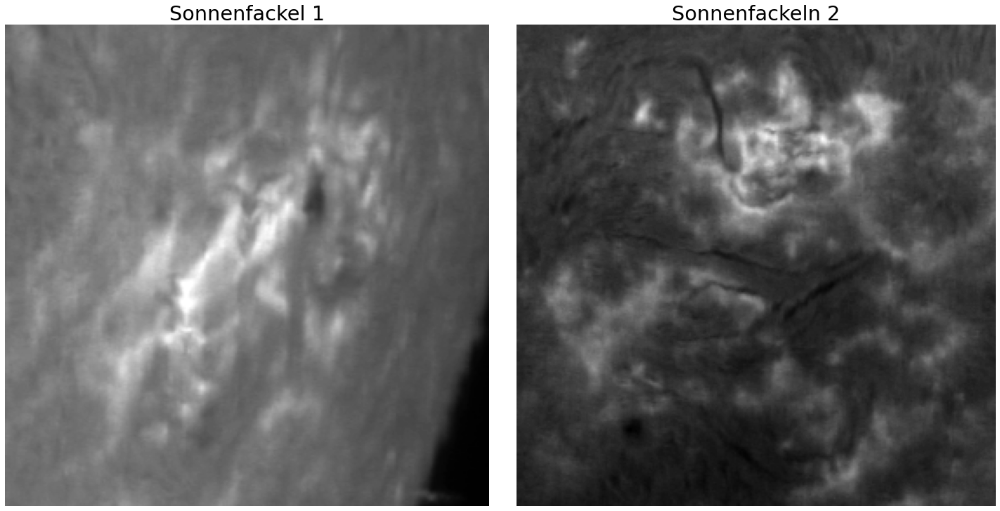

In [547]:
Sonnenfackel1 = cv2.imread('Abbildungen/Sonnenfackel1.png', cv2.IMREAD_GRAYSCALE)
Sonnenfackeln2 = cv2.imread('Abbildungen/Sonnenfackeln2.png', cv2.IMREAD_GRAYSCALE)

plt.figure(constrained_layout=True,figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.imshow(Sonnenfackel1, cmap = 'gray')
plt.title('Sonnenfackel 1')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(Sonnenfackeln2, cmap = 'gray')
plt.title('Sonnenfackeln 2')
plt.axis('off')

Als nächstes erfolgt die Betrachtung der Filamente und Protuberanzen im Flügel der $\text{H}_{\alpha}$-Linie. Dazu werden eine der zuvor analysierten Protuberanzen und eines der bereits untersuchten Filamente ausgewählt. Das Bild im Bereich der entsprechenden Struktur wird bei verschiedenen Wellenlängenverschiebungen vom Minimum der $\text{H}_{\alpha}$-Linie untersucht.

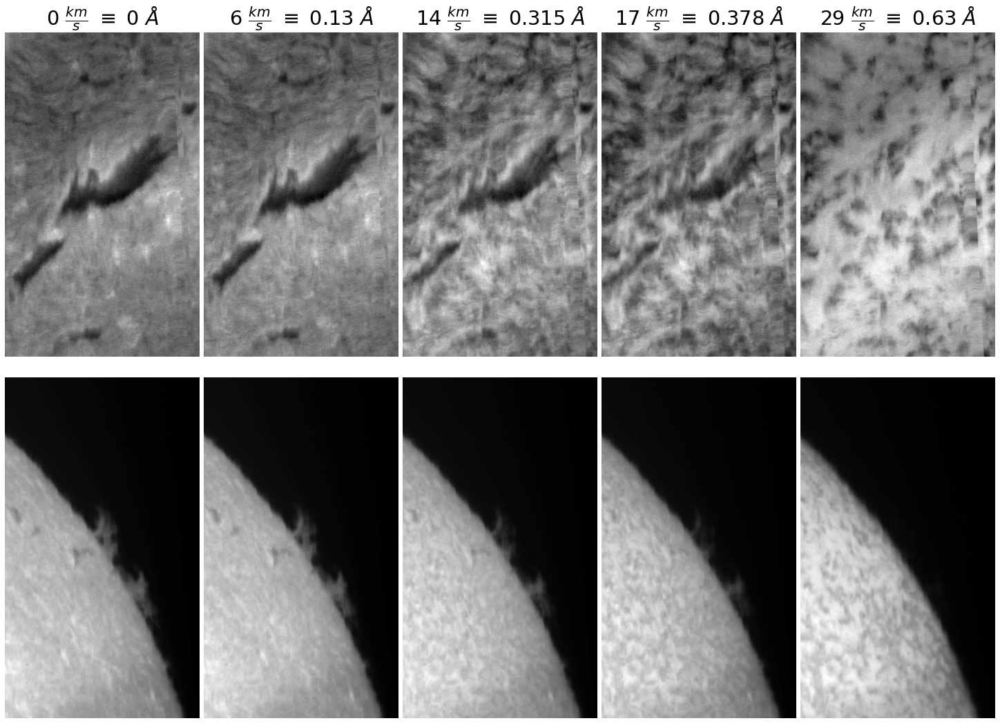

In [548]:
filenames = ['center', 'red2', 'red5', 'red6', 'red10']
velocities = ['0 $\\frac{km}{s}$', '6 $\\frac{km}{s}$', '14 $\\frac{km}{s}$', '17 $\\frac{km}{s}$', '29 $\\frac{km}{s}$']
delta_lambda = ['0 $\AA$', '0.13 $\AA$', '0.315 $\AA$','0.378 $\AA$', '0.63 $\AA$', ]

plt.figure(constrained_layout=True,figsize=(20, 14.5))
for i in range(5):
    image_filament = cv2.imread('Abbildungen/HAlphaStructure'+filenames[i]+'.png', cv2.IMREAD_GRAYSCALE)
    plt.subplot(2, 5, i+1)
    plt.imshow(image_filament, cmap = 'gray')
    plt.title(velocities[i]+ ' $\equiv$ ' +  delta_lambda[i])
    plt.axis('off')
    image_protuberance = cv2.imread('Abbildungen/HAlphaStructureProtuberance'+filenames[i]+'.png', cv2.IMREAD_GRAYSCALE)
    
    plt.subplot(2, 5, 5+i+1)
    plt.imshow(image_protuberance, cmap = 'gray')
    plt.axis('off')

Wie aus der obigen Abbildung ersichtlich ist, werden die Protuberanzen und Filamente bei verschobenen Wellenlängenbereichen schlechter sichtbar. Bei großen Wellenlängenverschiebungen von mehr als $0{,}65\ \text{A}$ sind sie schließlich überhaupt nicht mehr erkennbar. 

Die $\text{H}_{\alpha}$-Linie entsteht typischerweise in einer Höhe von 1250-1700 km über der Photosphäre (siehe: https://solarnutcase.livejournal.com/9556.html). Folglich können die beobachteten Strukturen also auf Phänomene in diesem Höhenbereich zurückgeführt werden. Wenn die Verschiebung zum Zentrum der $\text{H}_{\alpha}$-Linie also $0,63\,A$ erreicht, so verlässt man die Schicht der Sonnenatmosphäre in der die Strukturen erkannt werden können.

## Calcium Linie

Im Folgenden wird eine Aufnahme der Sonne im Bereich der Calcium-Linie bei $3933,6\,A$ betrachtet. Dabei werden Aufnahme sowohl im blauen Flügel als auch im roten Flügel des Minimums der Calcium-Linie betrachtet. In den folgenden Abbildungen sind Aufnahmen der Sonne bei den oberhalb der Abbildung angegebenen Abweichungen vom Minimum der Ca-Linie  zu sehen.

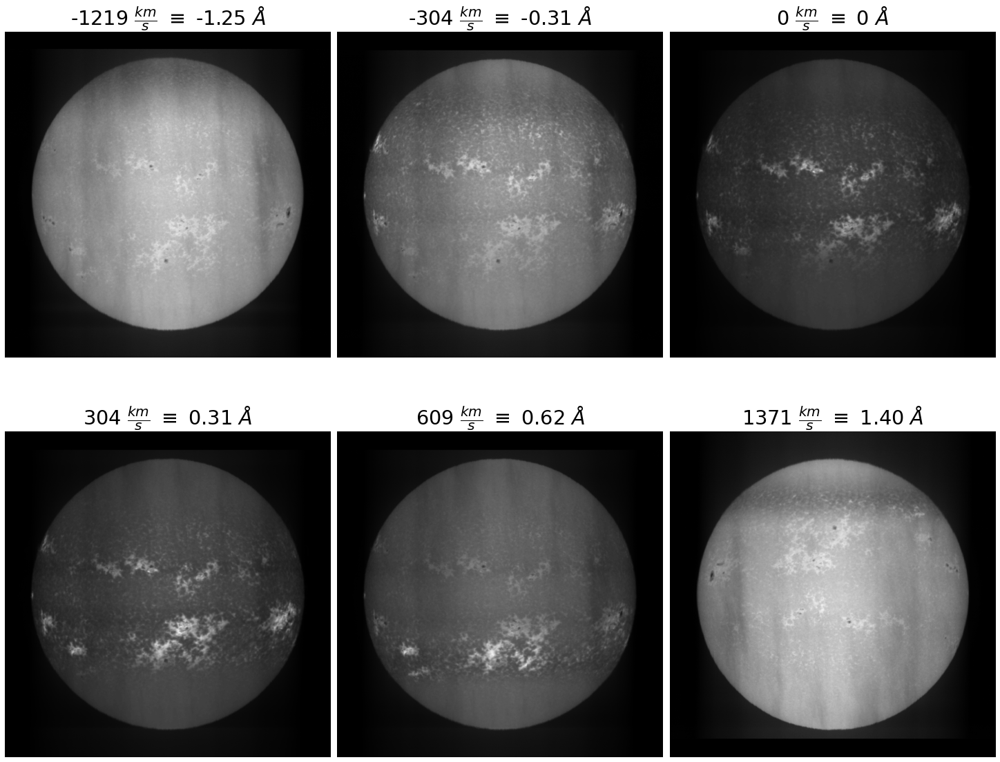

In [549]:
filenames = ['blue16', 'blue4', 'center', 'red4', 'red8', 'red18']
velocities = ['-1219 $\\frac{km}{s}$', '-304 $\\frac{km}{s}$', '0 $\\frac{km}{s}$','304 $\\frac{km}{s}$', '609 $\\frac{km}{s}$', '1371 $\\frac{km}{s}$']
delta_lambda = ['-1.25 $\AA$', '-0.31 $\AA$', '0 $\AA$','0.31 $\AA$', '0.62 $\AA$', '1.40 $\AA$']

plt.figure(constrained_layout=True,figsize=(20, 16))
for i in range(6):
    image = cv2.imread('Abbildungen/'+filenames[i]+'.png', cv2.IMREAD_GRAYSCALE)
    plt.subplot(2, 3, i+1)
    plt.imshow(image, cmap = 'gray')
    plt.title(velocities[i] + ' $\equiv$ ' +  delta_lambda[i])
    plt.axis('off')

Wie aus den oben stehenden Abbildungen ersichtlich ist, sind bestimmte Strukturen in den Flügeln der Calcium-Linie schlechter sichtbar als im Zentrum des Minimums. Um dies genauer zu untersuchen, soll nun ein Ausschnitt der Aufnahme am Westrand der Sonne, unmittelbar unterhalb des Sonnenäquators, näher betrachtet werden.

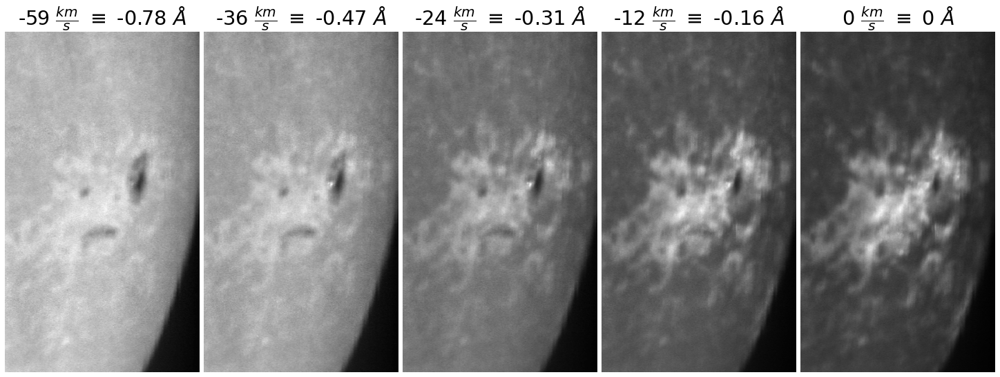

In [550]:
filenames = ['structureblue10', 'structureblue6', 'structureblue4', 'structureblue2', 'structurecenter']
velocities = ['-59 $\\frac{km}{s}$', '-36 $\\frac{km}{s}$', '-24 $\\frac{km}{s}$', '-12 $\\frac{km}{s}$', '0 $\\frac{km}{s}$']
delta_lambda = ['-0.78 $\AA$', '-0.47 $\AA$', '-0.31 $\AA$','-0.16 $\AA$', '0 $\AA$']

plt.figure(constrained_layout=True,figsize=(20, 14))
for i in range(5):
    image = cv2.imread('Abbildungen/'+filenames[i]+'.png', cv2.IMREAD_GRAYSCALE)
    plt.subplot(1, 5, i+1)
    plt.imshow(image, cmap = 'gray')
    plt.title(velocities[i] + ' $\equiv$ ' +  delta_lambda[i])
    plt.axis('off')

Wie aus den oben stehenden Abbildungen ersichtlich ist, lässt sich im Bild des Zentrums der Calcium-Linie (rechtes Bild) eine Sonnenfackel relativ gut erkennen. Wenn jedoch die Bilder in den Flügeln der Calcium-Linie betrachtet werden, wird die Sonnenfackel kaum noch sichtbar. Die Calcium-Linie tritt typischerweise in einer Höhe von etwa $500-1600\ \text{km}$ über der Sonnenoberfläche auf (siehe: https://solarnutcase.livejournal.com/9556.html). Daher befinden sich die beobachteten Sonnenfackeln vermutlich in diesem Höhenbereich der Sonnenatmosphäre.

Da die Sonnenfackel in den Flügeln der Calcium-Linie ab einer bestimmten Wellenlängenabweichung nicht mehr sichtbar ist, verlässt man ab dann den Höhenbereich der Sonnenatmosphäre, in dem die Strukturen der Calcium-Linie erkennbar sind.

## Fe-Linien

Die Fe-Linien bei 630 nm eignen sich besonders gut um Sonnenflecken zu betrachten. Sonnenflecken sind dunkle, kühlere Bereiche auf der Sonnenoberfläche, die durch starke Magnetfelder verursacht werden und weniger Licht abstrahlen als ihre Umgebung. Sie treten in einem Zyklus von etwa elf Jahren auf und dienen als Maß für die Sonnenaktivität. Sonnenflecken entstehen durch die differentielle Rotation der Sonne, bei der sich die Äquatorregionen schneller drehen als die Pole. Diese ungleichmäßige Rotation verzerrt das Magnetfeld der Sonne, wodurch lokale Magnetfeldbögen entstehen, die durch die Photosphäre brechen. Diese Bögen behindern den Wärmetransport, wodurch die betroffenen Regionen abkühlen und als dunkle Flecken sichtbar werden. Sie treten paarweise auf, wobei jeder Fleck des Paares eine entgegengesetzte magnetische Polarität hat. Sonnenflecken bestehen aus zwei Hauptbereichen: der Umbra und der Penumbra. Die Umbra ist der zentrale, dunklere Teil des Sonnenflecks, wo das Magnetfeld am stärksten ist und senkrecht zur Sonnenoberfläche verläuft. Die Penumbra umgibt die Umbra und erscheint heller, da hier das Magnetfeld schwächer ist und die Feldlinien parallel zur Oberfläche verlaufen. Dadurch wird der Energiefluss weniger stark blockiert, wodurch die Temperatur höher ist als in der Umbra, aber immer noch niedriger als in der restlichen Sonnenoberfläche. Sonnenflecken treten oft in Gruppen auf. In den Abbildungen "Aufnahme der Eisenline" und "Einzelner Sonnenfleck" sind eine Aufnahme der Sonne im Bereich der Fe-Linien bei $\lambda = 6301,5\,A$ und eine vergößerter Aufnahme eines Sonnenflecks zu sehen.

(-0.5, 260.5, 264.5, -0.5)

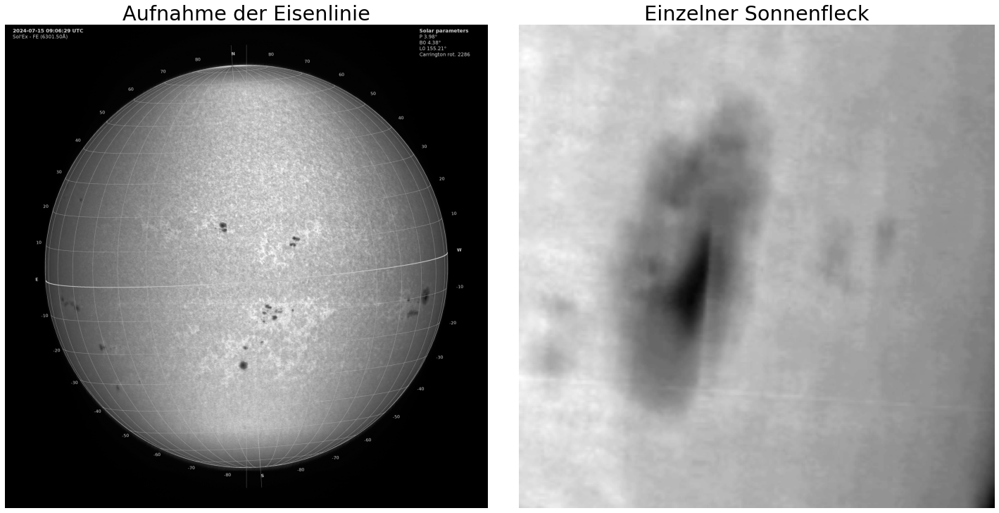

In [551]:
KarteSonnenflecken = cv2.imread('Abbildungen/KarteSonnenflecken.png', cv2.IMREAD_GRAYSCALE)
SonnenfleckMitUmbraUndPenumbra = cv2.imread('Abbildungen/SonnenfleckUmbraPenumbra.png', cv2.IMREAD_GRAYSCALE)

plt.figure(constrained_layout=True,figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.imshow(KarteSonnenflecken, cmap = 'gray')
plt.title('Aufnahme der Eisenlinie')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(SonnenfleckMitUmbraUndPenumbra, cmap = 'gray')
plt.title('Einzelner Sonnenfleck')
plt.axis('off')

In der Abbildung "Aufnahme der Eisenlinie" kann man zahlreiche dunkle Sonnenflecken erkennen. Außerdem ist z.B. im Bereich zwischen $0^\circ$ bis $-20^\circ$ südlicher Breite und $0^\circ$ bis $20^\circ$ westlicher Länge eine Gruppe von Sonnenflecken zu erkennen. Bei ca. $10^\circ$ südlicher Breite ist am Westrand der Sonne ein größer Sonnenfleck zu sehen. Dieser Sonnenfleck ist in der Abbildung "Einzelner Sonnenfleck" vergrößert dargestellt. Bei diesem Sonnenfleck kann man deutlich das dunkle Fleckzentrum (Umbra) und den umgebenden weniger dunklen Bereich (Penumbra) erkennen.

# Dopplergramm und Rotationsgeschwindigkeit der Sonne

## Dopplergramm der Sonne

Zur Erstellung des Dopplergramms wurde ein Bild der Sonne, welches im Bereich der Eisenlinie bei $6301,5A$ liegt verwendet. Danach wurden das Bild 'red' erstellt, welches um +2 pixel und das Bild 'blue', welches um -2 Pixel auf der y-Achse der Flanke der Absorptionslinie vom Intensitätsminimus verschoben ist berechnet. Jedes Pixel entspricht dabei einer Wellenlängenverschiebung von $0,065A$. Danach wurde dann das blaue Bild von dem roten bild subtrahiert unnd ein offset von 127 hinzugefügt:

$\texttt{red = img(+2)}$

$\texttt{blue = img(-2)}$

$\texttt{doppler = red\,-\,blue\,+\,127}$.


Der Hintergrund des so erhaltenen Bildes war nun grau, da der Wert der Pixel 127 ist, also dem Offset entspricht. Deshalb wurde nun als nächstes der Hintergrund mit dem $\texttt{GNU Image Manipulation Program}$ schwarz eingefärbt. Schließlich wurde ein Farbverlauf von blau nach rot auf das Bild, ohne den schwarzen Hintergund angewendet, um das finale Dopplergramm zu erstellen.


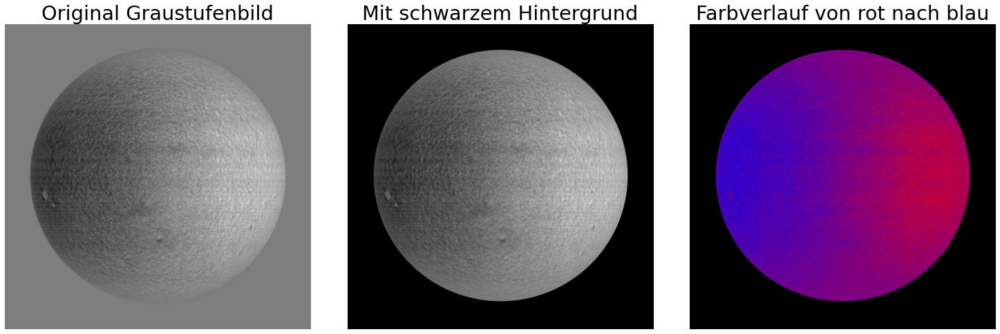

In [552]:
# Bild laden (Originalbild in Farbe)
raw_image = cv2.imread('Abbildungen/Dopplergramm.png')
raw_image_gray = cv2.cvtColor(raw_image, cv2.COLOR_BGR2GRAY)
processed_image = cv2.imread('Abbildungen/Dopplergramm1.png')
processed_image_gray = cv2.cvtColor(processed_image, cv2.COLOR_BGR2GRAY)

def colorize_gradient(image):
    """
    Färbt die nicht schwarzen Pixel im Bild von Blau nach Rot ein.
    """
    # Bild in Graustufen konvertieren
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Erstelle eine Maske für nicht-schwarze Pixel
    threshold = 10
    mask_non_black = np.any(image > threshold, axis=-1)

    # Erstelle ein leeres RGB-Bild für das Ergebnis
    result_image = np.zeros_like(image)

    # Finde die maximale Helligkeit im Bild (um den Farbverlauf zu normalisieren)
    max_brightness = np.max(gray)

    # Normalisiere den Grauwertbereich auf [0, 1]
    normalized_gray = gray / max_brightness

    # Berechne die Farbmischung von Blau (0, 0, 255) bis Rot (255, 0, 0)
    red = np.array([0, 0, 255], dtype=np.uint8)
    blue = np.array([255, 0, 0], dtype=np.uint8)

    # Lineare Interpolation für den Farbverlauf
    gradient = (1 - normalized_gray)[:, :, np.newaxis] * blue + normalized_gray[:, :, np.newaxis] * red

    # Setze die Farbmischung nur für die nicht-schwarzen Pixel
    result_image[mask_non_black] = gradient[mask_non_black]

    return result_image

# Bild einlesen
image = cv2.imread('Abbildungen/Dopplergramm1.png')

# Färbe das Bild
result_image = colorize_gradient(image)

# Visualisiere das Ergebnis
plt.figure(figsize=(21, 7))

# Original Graustufenbild
plt.subplot(1, 3, 1)
plt.imshow(raw_image_gray, cmap='gray')
plt.title('Original Graustufenbild')
plt.axis('off')

#Bild mit schwarzen Hiontergrund
plt.subplot(1, 3, 2)
plt.imshow(processed_image_gray, cmap='gray')
plt.title('Mit schwarzem Hintergrund')
plt.axis('off')

# Bearbeitetes Bild mit Farbverlauf
plt.subplot(1, 3, 3)
plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
plt.title('Farbverlauf von rot nach blau')
plt.axis('off')

plt.tight_layout()
plt.show()

Wie man in dem Dopplergramm erkennen kann, zeigt sich, dass die linke Seite der Sonne blau verschoben und die rechte Seite rot veschoben ist. Dabei bewegt sich der rot verschobene Bereich vom Betrachter weg und der blau verschobene Bereich bewegt sich auf den Betrachter zu. Somit lässt sich die Drehrichtung der Sonne erkennen. 

## Rotationsgeschwindigkeit der Sonne

Zunächst werden zur Berechnung der Rotationsgeschwindigkeit der Sonne zwei Frames, einer am Westrand und einer am Ostrand der Sonne, eingelesen. Aus diesen Frames werden die gemittelten Spektren berechnet. Anschließend wird an diese gemittelten Spektren eine Summe von vier Voigt-Profilen angepasst. Dabei werden die Wellenlängenbereiche der beiden atmosphärischen $O_2$-Absorptionslinien sowie der beiden solaren Eisenlinien im Bereich von $6301\,A$ bis $6303\,A$ betrachtet. Jede der beiden Eisenlinien und jede der beiden $O_2$-Absorptionslinien wird durch ein Voigt-Profil in der Summe der Voigt-Profile berücksichtigt. Mit den Anpassungen der Profile werden dann die Wellenlängendifferenzen der $O_2$- und Fe-Linien bestimmt.

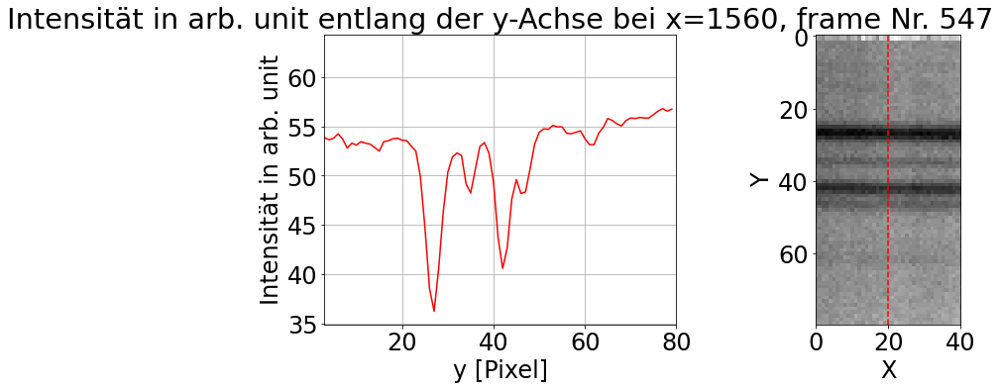

In [553]:
# zuerst das Frame am Westrand der Sonne
params_spectrum = {'file_path': 'fe_linie_unpolarisiert',
            'frame_index' : 547,
            'x_value' : 1560, 
            'range_averaging' : 10, # Anzahl der Pixel in x-Richtung über die das Spektrum gemittelt wird
            'range_plot_image' : 20,
            'lambda_0' : 6299.86,
            'pixel_size' : 0.065 # Die Größe eines Pixels beträgt bei der Messung 0.065 Å

        }

# plotten des Bildabschnitts und des gemittelten Spektrums
#image = extract_single_frame(params_spectrum)
image = cv2.cvtColor(cv2.imread('Abbildungen/'+params_spectrum['file_path']+'_'+str(params_spectrum['frame_index'])+'.png'), cv2.COLOR_BGR2GRAY)
average_spectrum = get_spectrum(image, params_spectrum)
plot_spectrum(average_spectrum, image, params_spectrum)

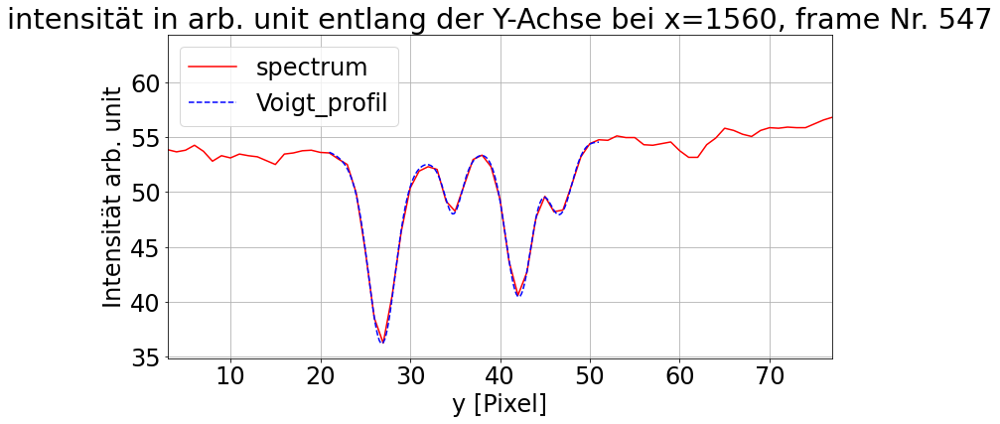

In [554]:
# Fiten der Summe aus 4 Voigt-Profilen an das gemittelte Spektrum
fit_function = generate_voigt_sum_function(4)
init_guesses_for_fit = {
    'λ_0_1' : 26, 'γ_1' : 0.7, 'σ_1' : 1.1, 'amplitude_1' : 57,
    'λ_0_2' : 34, 'γ_2' : 0.4, 'σ_2' : 0.8, 'amplitude_2' : 11,
    'λ_0_3' : 40, 'γ_3' : 1.3, 'σ_3' : 2, 'amplitude_3' : 11,
    'λ_0_4' : 43, 'γ_4' : 1.1, 'σ_4' : 0.5, 'amplitude_4' : 3,
    'base_intensity' : 40
}

left_lim, right_lim = 21, 51

popt, pcov = curve_fit(fit_function, np.arange(left_lim, right_lim), average_spectrum[left_lim:right_lim], p0=list(init_guesses_for_fit.values()))

fig, ax = plt.subplots(figsize=(12, 6))
ax = plot_fit_function(ax, left_lim, right_lim, fit_function, popt, average_spectrum, params_spectrum, label_spectrum = "spectrum", label_fit = 'Voigt_profil')
plt.legend()
plt.show()

In [555]:
# Berechnung der Wellenlängendifferenzen zwischen den Atmosphärischen O_2 Linien und den solaren Fe-Linien
Δλ_west = np.array([popt[4]-popt[0], popt[12]-popt[0], popt[4]-popt[8], popt[12]-popt[8]], dtype = float)*params_spectrum['pixel_size']

# Berechung der Unsicherheiten aus der Varianz der Fit Parameter
uΔλ_west = np.array([np.sqrt(pcov[4,4]+pcov[4,4]), np.sqrt(pcov[12,12]+pcov[0,0]),  \
    np.sqrt(pcov[8,8]+pcov[4,4]), np.sqrt(pcov[12,12]+pcov[8,8])], dtype = float)*params_spectrum['pixel_size']

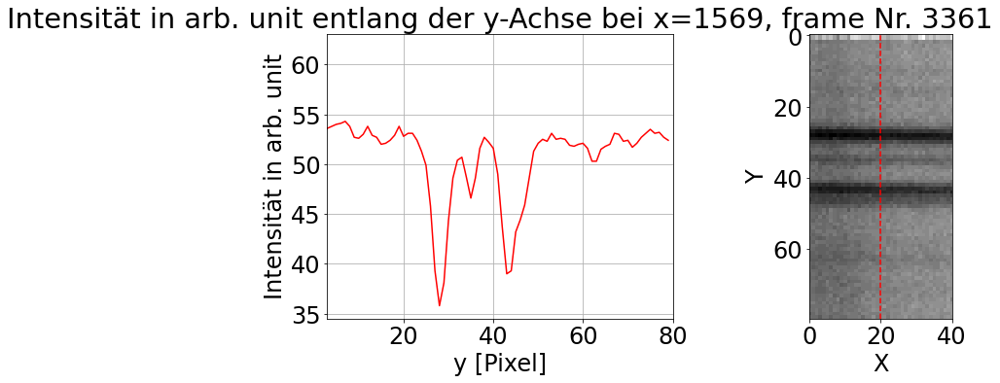

In [556]:
# Nun das ganze nochmal für ein Frame am Ostrand der Sonne
params_spectrum = {'file_path': 'fe_linie_unpolarisiert',
            'frame_index' : 3361,
            'x_value' : 1569, 
            'range_averaging' : 5,
            'range_plot_image' : 20,
            'lambda_0' : 6299.86,
            'pixel_size' : 0.065

        }
        
#image = extract_single_frame(params_spectrum)
image = cv2.cvtColor(cv2.imread('Abbildungen/'+params_spectrum['file_path']+'_'+str(params_spectrum['frame_index'])+'.png'), cv2.COLOR_BGR2GRAY)
average_spectrum = get_spectrum(image, params_spectrum)
plot_spectrum(average_spectrum, image, params_spectrum)

[28.12201401  0.3601697   1.45064037 74.5008631  34.98988875  0.61289411
  0.77329674 19.98817796 43.32033055 -0.10592603  1.45594561 46.24361654
 46.65438968  0.91652607  0.8042857  29.10678446 52.86595097]


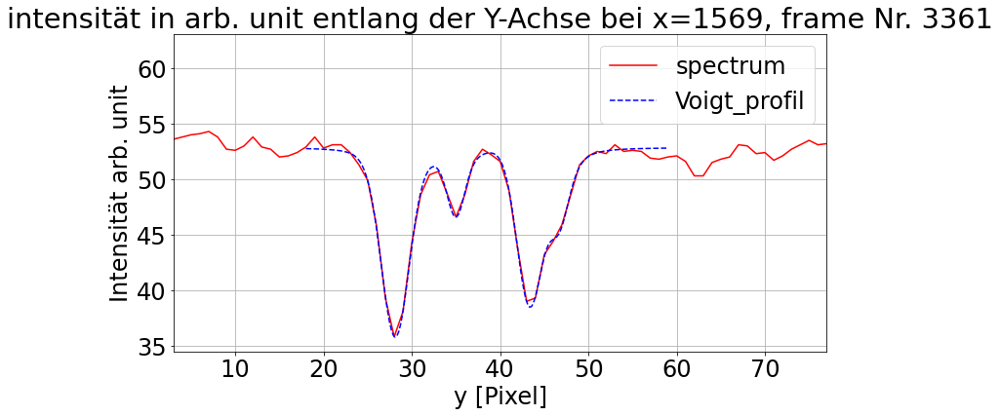

In [557]:
fit_function = generate_voigt_sum_function(4)
init_guesses_for_fit = {
    'λ_0_1' : 28, 'γ_1' : 0.7, 'σ_1' : 1.5, 'amplitude_1' : 25,
    'λ_0_2' : 37, 'γ_2' : 0.4, 'σ_2' : 0.3, 'amplitude_2' : 10,
    'λ_0_3' : 43.5, 'γ_3' : 1.0, 'σ_3' : 1.4, 'amplitude_3' : 12,
    'λ_0_4' : 47.25, 'γ_4' : 1.1, 'σ_4' : 1.6, 'amplitude_4' : 8,
    'base_intensity' : 50
}

left_lim, right_lim = 18, 59

popt, pcov = curve_fit(fit_function, np.arange(left_lim, right_lim), average_spectrum[left_lim:right_lim], p0=list(init_guesses_for_fit.values()))
fig, ax = plt.subplots(figsize=(12, 6))
print(popt)
ax = plot_fit_function(ax, left_lim, right_lim, fit_function, popt, average_spectrum, params_spectrum, label_spectrum = "spectrum", label_fit = 'Voigt_profil')
plt.legend()
plt.show()

In [558]:
Δλ_east = np.array([popt[4]-popt[0], popt[12]-popt[0], popt[4]-popt[8], popt[12]-popt[8]], dtype = float)*params_spectrum['pixel_size']

uΔλ_east = np.array([np.sqrt(pcov[4,4]+pcov[0,0]), 
    np.sqrt(pcov[12,12]+pcov[0,0]),  
    np.sqrt(pcov[8,8]+pcov[4,4]), np.sqrt(pcov[12,12]+pcov[8,8])], dtype = float)*params_spectrum['pixel_size']

Zur Berechung der Rotationsgeschwindigkeit, wird der Dopplereffekt an den Sonnenrändern ausgenutzt. Dabei wird ausgenutzt, das die Wellenlängen der Atmosphärischen Absorptionslinien nicht durch den Dopplereffekt beeinflusst werden.

Die Rotationsgeschwindigkeit kann aus den gefitteten Peaks des Spektrums am Ost- und Westrand der Sonne wie folgt berechnet werden: $\rm{v}_{\rm{rot}}=\frac{c}{\lambda_{\rm{Fe, ruhe}}}\left[\left(\lambda_{\rm{Fe, west}} - \lambda_{\rm{0_2, west}}\right)-\left(\lambda_{\rm{Fe, ost}} - \lambda_{\rm{O_2, ost}}\right)\right]$. 

 Dabei ergibt sich aufgrund der Unsicherheit (Varianz) der Fit Parameter eine kombinierte Messunsicherheit von 
 
 $\rm{u}(\rm{v}_{\rm{rot}})=\frac{c}{2\lambda_{\rm{Fe, ruhe}}}\sqrt{\rm{u}\left(\lambda_{\rm{Fe, west}}\right)^2 + \rm{u}\left( \lambda_{\rm{0_2, west}}\right)^2 + \rm{u}\left(\lambda_{\rm{Fe, ost}}\right)^2 +\rm{u}\left(\lambda_{\rm{O_2, ost}}\right)^2}$.

In [559]:
c = 299792458
λ_0 = [6301.5, 6302.5]

diff = Δλ_west - Δλ_east 
print(diff)
u_diff = np.sqrt(uΔλ_west**2 + uΔλ_east**2)
print(u_diff)
v = c/2*np.array([diff[0]/λ_0[0], diff[1]/λ_0[0], diff[2]/λ_0[1], diff[3]/λ_0[1] ], dtype = float)
uv = c/2*np.array([abs(u_diff[0]**2/λ_0[0]**2), abs(u_diff[1]/λ_0[0]), abs(u_diff[2]/λ_0[1]), abs(u_diff[3]/λ_0[1]) ], dtype = float)

df = pd.DataFrame({
    "v [m/s]" : v,
    "U(v) [m/s]" : uv,
})

print(df.round(0).astype(int))


print(f"\nDurchschnitt: v = {v.mean().round(0).astype(int)} ± {uv.mean().round(0).astype(int)} m/s")
print(f"Literaturwert v = 1.7 km/s")

[0.07058237 0.0821542  0.06638931 0.07796115]
[0.00834654 0.01553518 0.01009006 0.01684074]
   v [m/s]  U(v) [m/s]
0     1679           0
1     1954         370
2     1579         240
3     1854         401

Durchschnitt: v = 1767 ± 253 m/s
Literaturwert v = 1.7 km/s


Obwohl es für das Frame am Ostrand der Sonne sehr schwer ist die Minima der $\text{O}_2$-Bande unde der 2. Fe-Linie zu erkennen, ist der berechnete Wert für die Rotationsgeschwindigkeit der Sonne von $\rm{v}_{\rm{rot}}=1,767 \pm 0,253\, \frac{km}{s}$ eine guter Näherung für den Literaturwert von $1,7\,\frac{\rm{km}}{\rm{s}}$, welcher aus https://doi.org/10.1119/1.17119 entnommen wurde.

# Magnetogramm und Sonnenflecken

## Übersicht Sonnenflecken

Im Folgenden ist eine Aufnahme der Sonne im Bereich der Fe-Linien bei 6301,5 A zu sehen. Dabei erkennt man deutlich mehrere Sonnenflecken. Drei der Sonnenflecken wurden in der Abbildung markiert, da zu diesen Sonnenflecken eine Berechnung zur magnetischen Feldstärke durchgeführt wird.

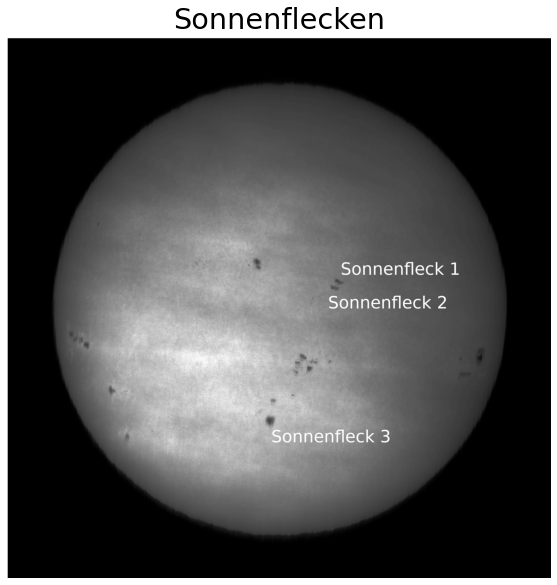

In [560]:
# Bild laden
img_path = "Abbildungen/UebersichtSonnenflecken.png"
img = mpimg.imread(img_path)

# Bild anzeigen
plt.figure(figsize=(14, 10))
plt.imshow(img)
plt.axis('off')  # Achsen ausblenden
plt.title('Sonnenflecken')
plt.show()

## Magnetogramm

Als nächstes soll nun ein Magnetogramm betrachtet werden. Der Zeemanneffekt führt zu einer Linienaufspaltung der Fe-Linien. Bei Beobachtung longitunidal zu den Magnetfeldinien kann man eine rechts zirkular und eine links zirkular polarisierte Linie mit verschiedenen Frequenzen beobachten. 


Eine der zirkular polarisierten Komponenten auch als $\sigma^+$-Linie bezeichnet liegt bei einer kleineren Wellenlänge (größere Frequenz) und die andere zirkular polarisierten Komponenten auch als $\sigma^-$-Linie bezeichnet liegt bei einer größere Wellenlänge (kleinere Frequenz) als die Wellenlänge der Fe-Linie ohne Magnetfeld.

Mit Hilfe eines $\frac{\lambda}{4}$-Plättchens und eines dahinter befindelichen linearen Polaristors konnten die rechts bzw. links polarisierte Lininen herausgefiltert werden. Für das Magnetogramm wurden als erstes zwei Serien der Sonne aufgenommen, eines mit der links zirkular polarisierten Linie und eines mit der rechts zirkular polarisierten Linie. Danach wurden für beide aufgenommenen Serien jeweils ein Bild im blauen Flügel $\rm{B}_{\text{links zirkular}}$ und $\rm{B}_{\text{rechts zirkular}}$ und im roten Flügel $\rm{R}_{\text{links zirkular}}$ und $\rm{R}_{\text{rechts zirkular}}$ der Fe-Linie bei $6301,5$ A erstellt.

Mit Hilfe dieser Bilder wurde dann ein Magnetogramm erstellt:

$\text{Magnetogramm} = (\rm{B}_{\text{rechts zirkular}} - \rm{R}_{\text{rechts zirkular}}) - (\rm{B}_{\text{links zirkular}} - \rm{R}_{\text{links zirkular}})$,

eine genaue Beschreibung der Methode ist unter http://www.astrosurf.com/rondi/obs/shg/magnetogram_anglais.htm zu finden.

Für das erstellte Magnetogramm wurden die Aufnahmen in den Flügeln um jeweils $\pm 2$ Pixel neben dem Minimum der Fe Linie aufgenommen. Dabei entspricht ein Pixel einer Wellenlänge von $0,065\, A$. 

Außerdem wird noch das Magnetogramm auf ein Bild der Sonne bei der Fe-Linie bei $6301,5\,A$ gelegt. Dafür wird auf das schwarz-weiß Bild der Sonne im Bereich der Fe-Linien eine farbige Darstellung des Magnetogramms addiert, wodurch das Magnetfeld im Bereich der sichbaren Strukturen als Farbverlauf über den Strukturen liegt. Der Hintergrund der Sonne wird schwarz dargestellt.

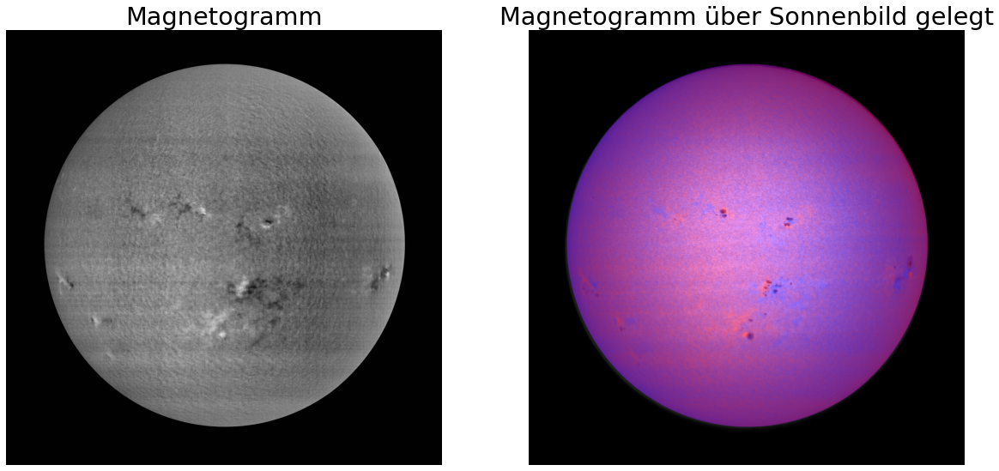

In [561]:
# Bilder einlesen
sun_image = cv2.imread('Abbildungen/SonnenbildFuerMagnetogram.png', cv2.IMREAD_GRAYSCALE)  # Sonnenbild (Graustufen)
#sun_image = cv2.imread('Abbildungen/AufnahmeHAlphaLinie.png', cv2.IMREAD_GRAYSCALE)
magnetogram = cv2.imread('Abbildungen/Magnetogrammpm2.png', cv2.IMREAD_GRAYSCALE)  # Magnetogramm (Graustufen)

# Erstellen einer Maske für die schwarzen Bereiche im Magnetogramm
mask = (magnetogram > 10)  # Maske für nicht-schwarze Bereiche erstelle

# Da aufgrund der Berechnungsmethode eine zusätzlicher Farbverlauf von Ost nach West aufgrund der 
# Sonnenrotation zu sehen ist, wird noch eine Lineare Funktion der Position x in West-Ost-Richtung
# zu dem Magnetogramm Pixelweise in Abhängigkeit der x-Position des Pixels dazuaddiert, um die
# Verschiebung durch den Dopplereffekt auszugleichen  
height, width = magnetogram.shape
gradient = np.tile(-np.linspace(255, 0, width)*0.5, (height, 1))

# Gradienten zu dem Bild dazuaddieren
magnetogram= np.where(mask, magnetogram + gradient, magnetogram)

# Kontrast erhöhen für bessere Sichbarkeit der Strukturen
magnetogram = cv2.convertScaleAbs(magnetogram, alpha=1.5, beta=1)

# Schwarze Bereiche im Magnetogramm wieder auf schwarz setzen
magnetogram[~mask] = -255  

# Normalisieren des Magnetogramms
magnetogram_normalized = magnetogram / np.max(magnetogram)

# Konvertieren des Graustufen-Magnetogramms in eine Farbkarte
# Hier verwenden wir den Farbverlauf von Rot nach Blau
normed_values = (magnetogram_normalized[mask] - magnetogram_normalized[mask].min()) / (magnetogram_normalized[mask].max() - magnetogram_normalized[mask].min())
cmap = plt.get_cmap('viridis')
def custom_colormap(value):
    # Blau-Grün-Übergang
    r = ((1 - value) * 255).astype(np.uint8)  # Rot von 255 bis 0
    b = (value * 255).astype(np.uint8)        # Grün von 0 bis 255
    g = np.zeros_like(value, dtype=np.uint8)  # Blau bleibt 0
    return np.stack([r, g, b], axis=-1)
colored_values = custom_colormap(normed_values)
# Neues Bild erstellen und nicht-schwarze Punkte mit der Colormap färben
magnetogram_color = np.zeros((magnetogram.shape[0], magnetogram.shape[1], 3), dtype=np.uint8)
magnetogram_color[mask] = (colored_values * 255).astype(np.uint8)

# Konvertieren des Sonnenbilds von Graustufen in RGB für die Überlagerung
sun_image_rgb = cv2.cvtColor(sun_image[:np.shape(magnetogram)[0],:np.shape(magnetogram)[1]], cv2.COLOR_GRAY2RGB)
#sun_image_rgb = cv2.applyColorMap((sun_image_rgb).astype(np.uint8), cv2.COLORMAP_TURBO )

overlay = cv2.addWeighted(sun_image_rgb, 0.6, magnetogram_color, 0.7, 0)

# Anzeigen des überlagerten Bildes

plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.imshow(magnetogram_normalized, cmap = 'gray')
plt.title('Magnetogramm')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(overlay)
plt.title('Magnetogramm über Sonnenbild gelegt')

plt.axis('off')
plt.show()

Im Magnetogramm auf der linken Seite sind Bereiche mit unterschiedlichen magnetischen Feldstärken und Orientierungen des Magnetfelds auf der Sonne zu erkennen. Weiße und schwarze Bereiche entsprechen Regionen mit entgegengesetzter Polarität des Magnetfeldes. Deutlich sichtbar ist, dass die Sonnenflecken 1 und 2 ein Paar von Sonnenflecken mit entgegengesetzter Magnetfeldpolarisierung darstellen (vgl. Abbildung „Sonnenflecken“). In der rechten Abbildung stellen die rote und blaue Bereiche Regionen mit entgegengesetzter polarität dar.  Außerdem ist  In der rechten Abbildung „Magnetogramm über Sonnenbild gelegt“ zeigt sich, dass das Magnetfeld in der Umgebung der Sonnenflecken relativ stark und stärker polarisiert ist als in anderen Regionen der Sonne ohne Sonnenflecken. Zudem ist bei den unterschiedlich polarisierten Sonnenflecken zu erkennen, dass auch in deren Umgebung die Magnetfelder unterschiedliche Polarisierungen aufweisen. Besonders auffällig ist dies im Bereich der Sonnenfleckengruppe zentral unterhalb des Sonnenäquators, der in Abschnitt „Strukturen auf der Sonnenoberfläche - Fe-Linie“ bei der Beschreibung der Abbildung „Fe-Linie“ erwähnt wurde. Außerdem fällt auf, dass im Bereich der Sonnenfackeln, die oft nahe an den Sonnenflecken liegen, ebenfalls stärkere magnetische Felder vorherrschen als an anderen Orten auf der Sonne. Das sieht man z.B. gut bei den Sonnenfackeln, die unmittelbar rechts neben der zuvor angesprochenen Sonnenfleckengruppe liegen

An der Farbe des Magnetogramms lässt sich die Richtung des Magnetfelds ablesen: Weiße Bereiche zeigen Magnetfelder, die von der Sonnenoberfläche weg gerichtet sind, während schwarze Bereiche Magnetfelder darstellen, die zur Sonnenoberfläche hin zeigen. Somit kann man an der Abbildng erkennen, dass bei dem Sonnenfleck 1 das Magneteld zur Sonne hin gerichtet ist, beim  Sonnenfleck 2 ist es von der Sonne weg gerichtet. Bei Sonnenfleck 3 zeigt das Magnetfeld ebenfalls von der Sonnenoberfläche weg. 

## Magnetfeld in den Sonnenflecken

 Für die Wellenlängendifferenz $\Delta \lambda$ zwischen den polarisierten aufgespaltenen zirkular polarisierten Zeemanlinien und der nicht aufgespaltenen Linie mit Wellenlänge $\lambda$ gilt der Zusammenhang:

$\Delta \lambda = \pm 4,67\cdot 10^{-13}g\lambda^2\langle B_z\rangle$.

Somit lässt sich $\langle B_z\rangle$ und die zugehörige Unsicherheit wie folgt berechnen:

$\langle B_z\rangle = \frac{\Delta\lambda}{\pm 4,67\cdot 10^{-13}g\lambda^2}$

$u(\langle B_z\rangle) = \left|\frac{u(\Delta\lambda)}{\pm 4,67\cdot 10^{-13}g\lambda^2}\right|$.

Der Landé Faktor für die Fe-Linie bei $6301,5\,A$ beträgt $g=1,67$ und für die Fe-Linie bei $6302,5\,A$ beträgt er $g=2,49$.

Die Wellenlängen $\lambda_1$ der zirkular polarisierten Zeemanlinien und $\lambda_2$ der nicht aufgespaltenen Linie werden im folgenden wieder mit einem least-squares Fit mit Summen aus Voigt-Profilen bestimmt. 


Aus den gefitteten Wellenlägngen lässt sich dann die Wellenlängendifferenz gemäß $\Delta\lambda = \lambda_2-\lambda_1$ berechnen, wobei sich aus den Unsicherheiten der Fit Parameter eine Unsicherheit von

$u(\Delta \lambda)=\sqrt{u(\lambda_2)^2 +u(\lambda_1)^2}$
 
ergibt.

 Die Berechung von $\langle B_z\rangle$ wurde für beide Fe-Linien durchgeführt und dann wurde der Mittelwert berechnet.

Die Gleichungen sowie die Werte der Wellenlängen und der Landé Faktoren der Fe-Linien sind aus http://www.astrosurf.com/solex/sol-ex-observation-en.html entnommen. 
Bei der Berechung von $\Delta\lambda$ muss am Ende noch ein Offset abgezogen werden, das liegt daran, dass das Spektrum im Kontinuum und das im Sonnenfleck an unterschiedlichen Positionen der Sonne aufgenommen wurden. Die aufgezeichnete Fe-Linie ist gekrümmt, weshalb ein Polynom 3. Ordnung verwendet wird um die Krümmung zu berechnen, wie es in der folgenden Abbildung illusttriert ist:   

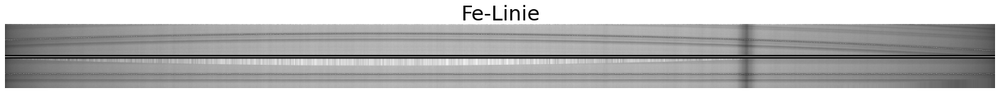

In [562]:
FeLinie = cv2.imread('Abbildungen/GekruemmteFELinie.png', cv2.IMREAD_GRAYSCALE)
plt.figure(figsize=(25, 25))
plt.imshow(FeLinie, cmap = 'gray')
plt.title('Fe-Linie')
plt.axis('off')
plt.show()

In der Abbildung "Fe-Linie" erkennt man in der oberen Hälfte die gekrümmten Fe-Linien in der unteren Hälfte sieht man das mit einem Polynom 3.Ordnung korrigierte Bild. Im folgenden wird das obere, nicht korrigierte Bild verwendet um bei einem x-Wert das Spektrum im Bereich der Fe-Linien zu fitten. Danach wird für Fits an verschiedenen x-Positionen die Verschiebung der Eisenlinien, die durch deren Krümmung zustandekommt, mit dem Korrekturpolynom berechnet und diese Differenz dann bei der Berechnung von $\Delta\lambda$ verwendet. Das Korrekturpolynom wurde mit dem Programm JSol'Ex berechnet.

Im Folgenden sollen die Sonnenflecken 1,2 und 3 betrachtet werden. Diese Sonnenflecken wurden gewählt, da sie alle relativ mittig im Bild der Sonne liegen.

### Unterschiedlich polarisiertes Sonnenfleckenpaar

Als erstes sollen nun die Sonnenflecken 1 und 2 untersucht werden. Dabei soll nun als erstes die Aufnahme mit dem links polarisierten Licht betrachtet werden.

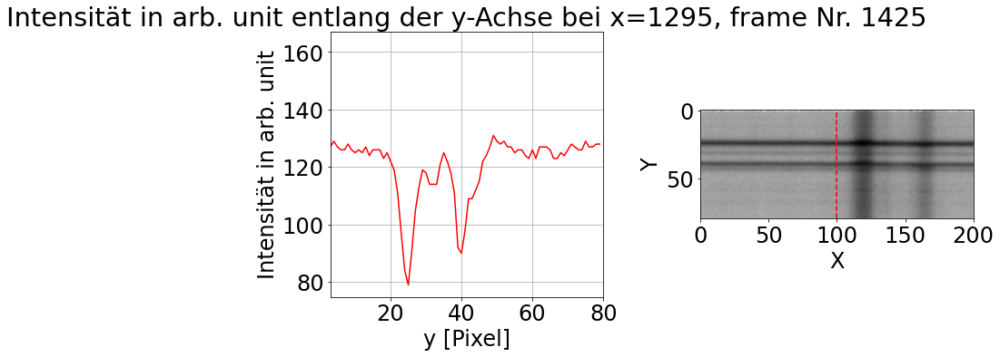

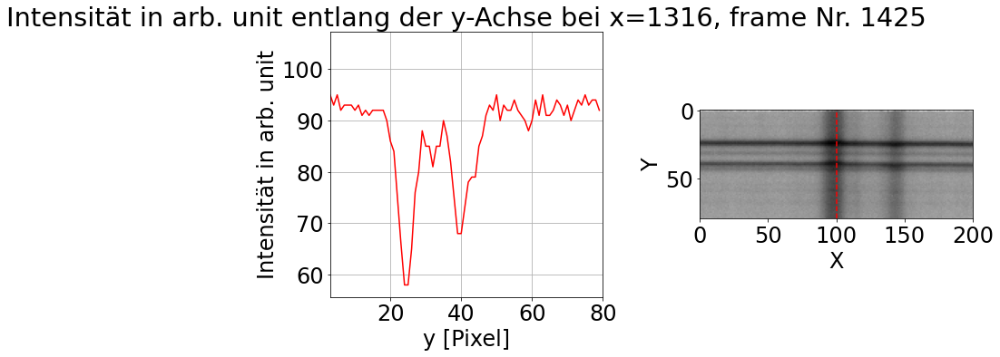

In [563]:
# Als erstes wird das Frame eingelesen
params_spectrum = {'file_path': 'fe_linie_links',
            'frame_index' : 1425,
            'x_value' : 1295, 
            'range_averaging' : 0, # Anzahl der Pixel in x-Richtung über die das Spektrum gemittelt wird
            'range_plot_image' : 100,
            'lambda_0' : 6301.5,
            'pixel_size' : 0.065 # Die Größe eines Pixels beträgt bei der Messung 0.065 Å

        }

# plotten des Bildabschnitts und des gemittelten Spektrums im Bereich der Sonnenflecken
#image = extract_single_frame(params_spectrum)
image = cv2.cvtColor(cv2.imread('Abbildungen/'+params_spectrum['file_path']+'_'+str(params_spectrum['frame_index'])+'.png'), cv2.COLOR_BGR2GRAY)

average_spectrum_continuum = get_spectrum(image, params_spectrum)
# als erstes mit vertikaler Line, an der Position an dem das Kontinuumspektrum entnommen wird
plot_spectrum(average_spectrum_continuum, image, params_spectrum)

params_spectrum['x_value'] = 1316
average_spectrum_sunspot =  get_spectrum(image, params_spectrum)
# als erstes mit vertikaler Line, an der Position an der das Sonnenfleckspektrum von Sonnenfleck 1 entnommen wird

plot_spectrum(average_spectrum_sunspot, image, params_spectrum)

In [564]:
# jetzt wird gefittet
init_guesses_for_fit = {
    'λ_0_1' : 25, 'γ_1' : 0.7, 'σ_1' : 1.1, 'amplitude_1' : 35,
    'λ_0_2' : 32, 'γ_2' : 0.4, 'σ_2' : 0.8, 'amplitude_2' : 10,
    'λ_0_3' : 39, 'γ_3' : 1.3, 'σ_3' : 2, 'amplitude_3' : 30,
    'λ_0_4' : 43, 'γ_4' : 1.1, 'σ_4' : 0.5, 'amplitude_4' : 20,
    'base_intensity' : 130
}

fit_function = generate_voigt_sum_function(4)

left_lim, right_lim = 14, 55

# einmal für das Spektrum in Kontinuum
popt_continuum, pcov_continuum = curve_fit(fit_function, np.arange(left_lim, right_lim), average_spectrum_continuum[left_lim:right_lim], p0=list(init_guesses_for_fit.values()))
init_guesses_for_fit['base_intensity'] = 97

#jetzt für das Spektrum von Sonnenfleck 1
popt_sunspot, pcov_sunspot = curve_fit(fit_function, np.arange(left_lim, right_lim), average_spectrum_sunspot[left_lim:right_lim], p0=list(init_guesses_for_fit.values()))

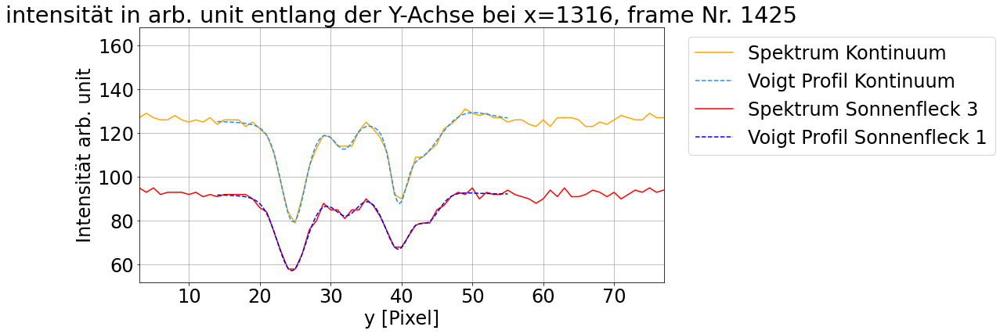

In [565]:
fig, ax = plt.subplots(figsize=(12, 6))
ax = plot_fit_function(ax, left_lim, right_lim, fit_function, popt_continuum, average_spectrum_continuum, params_spectrum, color_spectrum='orange', color_fit='dodgerblue', label_fit='Voigt Profil Kontinuum', label_spectrum='Spektrum Kontinuum')
ax = plot_fit_function(ax, left_lim, right_lim, fit_function, popt_sunspot, average_spectrum_sunspot, params_spectrum, label_fit='Voigt Profil Sonnenfleck 1', label_spectrum='Spektrum Sonnenfleck 3')
ax.grid()
ax.legend(loc='upper right', bbox_to_anchor=(1.65, 1))
plt.show()

In [566]:
λ_0 = [6301.5, 6302.5]
g = [1.67, 2.49]
# hier wir die Korrektur für die Krümmung der Fe-Linien berechnet
polynom_params =[1.6814126935886913E-10,1.6848286233141E-5,-0.04054634759487716,48.59008452788302]

def calcB(polynom_params, x_pos_1, x_pos_2, popt_continuum, pcov_continuum, popt_sunspot, pcov_sunspot):
    diff = thirt_order_polynomial(x_pos_1, polynom_params) - thirt_order_polynomial(x_pos_2, polynom_params)
    # hier wird die magnetische Feldstärke berechnet
    Δλ = np.array([abs(popt_continuum[0]-popt_sunspot[0]+diff), abs(popt_continuum[8]-popt_sunspot[8]+diff)], dtype = float)*params_spectrum['pixel_size']
    uΔλ = np.array([np.sqrt(pcov_continuum[0,0] + pcov_sunspot[0,0]), np.sqrt(pcov_continuum[8,8] + pcov_sunspot[8,8])], dtype = float)*params_spectrum['pixel_size']
    B_z = np.array([Δλ[0]/( λ_0[0]**2*g[0]), Δλ[1]/( λ_0[1]**2*g[1])], dtype = float)*1/(4.67*10**(-13))
    uB_z = np.array([uΔλ[0]/( λ_0[0]**2*g[0]), uΔλ[1]/( λ_0[1]**2*g[1])],dtype = float)*1/(4.67*10**(-13))

    return B_z, uB_z

# Fuer x_pos_1 muss wenn das minimum der Fe linie beim kontinuumspektrum links des Minimums beim 
# Sonnenfleckspektrum liegt die x position des Spektrums des Sonnenflecks gewählt werden, sonst die x Position
# des Kontinuumspektrums
B_z, uB_z = calcB(polynom_params, params_spectrum['x_value'], 1295, popt_continuum, pcov_continuum, popt_sunspot, pcov_sunspot)
print(f"\nDurchschnitt: B_z = {B_z.mean().round().astype(int)} ± {uB_z.mean().round(0).astype(int)} Gauss")


Durchschnitt: B_z = 1742 ± 409 Gauss


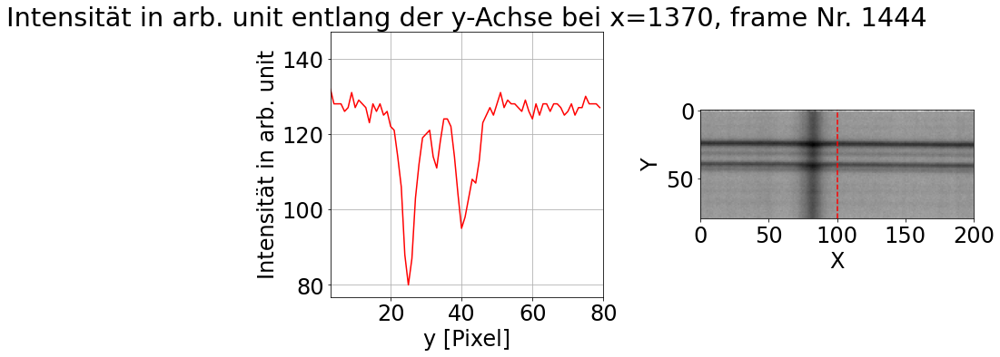

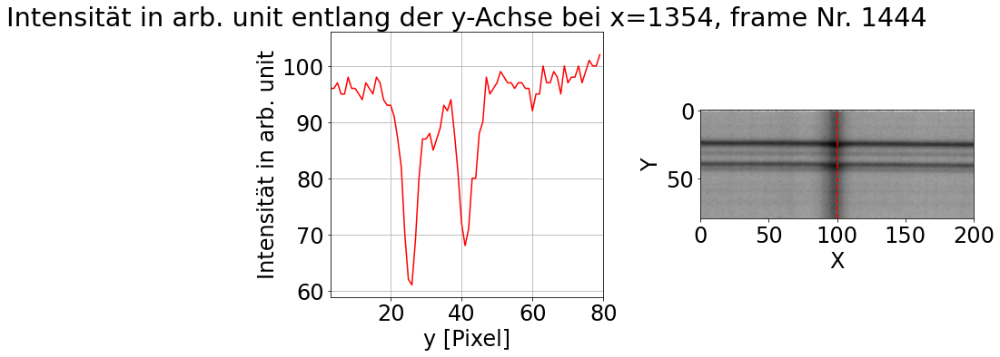

In [567]:
# plotten des Bildabschnitts und des gemittelten Spektrums im Bereich der Sonnenflecken
params_spectrum['frame_index'] = 1444
params_spectrum['x_value'] = 1370
#image = extract_single_frame(params_spectrum)
image = cv2.cvtColor(cv2.imread('Abbildungen/'+params_spectrum['file_path']+'_'+str(params_spectrum['frame_index'])+'.png'), cv2.COLOR_BGR2GRAY)
# als erstes mit vertikaler Line, an der Position an dem das Kontinuumspektrum entnommen wird
average_spectrum_continuum = get_spectrum(image, params_spectrum)
# jetzt mit vertikaler Line, an der Position an dem das SOnnenfleckspektrum von Sonnenfleck 2 entnommen wird
plot_spectrum(average_spectrum_continuum, image, params_spectrum)
params_spectrum['x_value'] = 1354


average_spectrum_sunspot =  get_spectrum(image, params_spectrum)
plot_spectrum(average_spectrum_sunspot, image, params_spectrum)

In [568]:
# jetzt wird gefittet
left_lim, right_lim = 17, 54

init_guesses_for_fit['base_intensity'] = 130
# einmal für das Spektrum in Kontinuum
popt_continuum, pcov_continuum = curve_fit(fit_function, np.arange(left_lim, right_lim), average_spectrum_continuum[left_lim:right_lim], p0=list(init_guesses_for_fit.values()))
init_guesses_for_fit['base_intensity'] = 97

#jetzt für das Spektrum von Sonnenfleck 1
popt_sunspot, pcov_sunspot = curve_fit(fit_function, np.arange(left_lim, right_lim), average_spectrum_sunspot[left_lim:right_lim], p0=list(init_guesses_for_fit.values()))

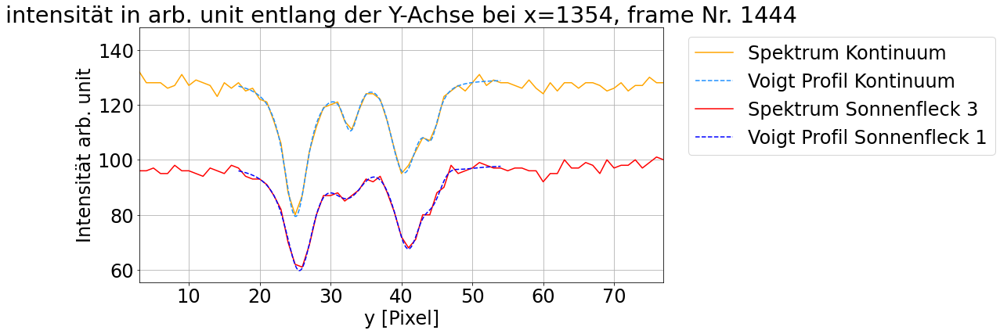

In [569]:
fig, ax = plt.subplots(figsize=(12, 6))
ax = plot_fit_function(ax, left_lim, right_lim, fit_function, popt_continuum, average_spectrum_continuum, params_spectrum, color_spectrum='orange', color_fit='dodgerblue', label_fit='Voigt Profil Kontinuum', label_spectrum='Spektrum Kontinuum')
ax = plot_fit_function(ax, left_lim, right_lim, fit_function, popt_sunspot, average_spectrum_sunspot, params_spectrum, label_fit='Voigt Profil Sonnenfleck 1', label_spectrum='Spektrum Sonnenfleck 3')
ax.grid()
ax.legend(loc='upper right', bbox_to_anchor=(1.65, 1))
plt.show()

In [570]:
# Parameter für die Korrektur der Krümmung der Fe-Linien 
polynom_params =[1.6033169022403885E-11,1.7547883388626714E-5,-0.041484979898363694,48.94347040347694]
B_z, uB_z = calcB(polynom_params, params_spectrum['x_value'], 1370, popt_continuum, pcov_continuum, popt_sunspot, pcov_sunspot)

print(f"\nDurchschnitt: B_z = {B_z.mean().round().astype(int)} ± {uB_z.mean().round(0).astype(int)} Gauss")


Durchschnitt: B_z = 1299 ± 366 Gauss


Als nächstes soll das Gleiche noch mit dem rechts polarisierten Licht untersucht werden.

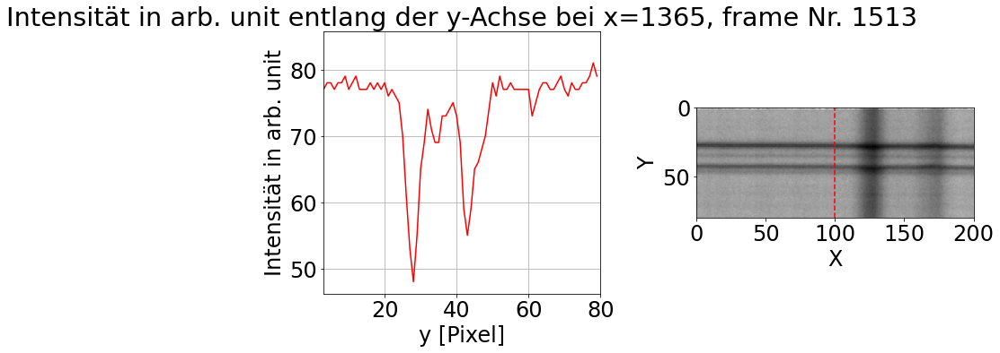

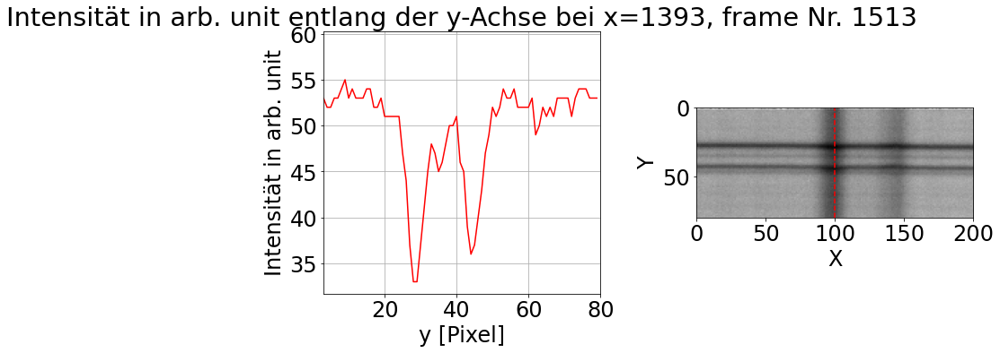

In [571]:
# Als erstes wird das Frame eingelesen
params_spectrum = {'file_path': 'fe_linie_rechts',
            'frame_index' : 1513,
            'x_value' : 1365, 
            'range_averaging' : 0, # Anzahl der Pixel in +- x-Richtung über die das Spektrum gemittelt wird
            'range_plot_image' : 100,
            'lambda_0' : 6301.5,
            'pixel_size' : 0.065 # Die Größe eines Pixels beträgt bei der Messung 0.065 Å
        }

# plotten des Bildabschnitts und des gemittelten Spektrums im Bereich der Sonnenflecken
#image = extract_single_frame(params_spectrum)
image = cv2.cvtColor(cv2.imread('Abbildungen/'+params_spectrum['file_path']+'_'+str(params_spectrum['frame_index'])+'.png'), cv2.COLOR_BGR2GRAY)
average_spectrum_continuum = get_spectrum(image, params_spectrum)
# als erstes mit vertikaler Line, an der Position an dem das Kontinuumspektrum entnommen wird
plot_spectrum(average_spectrum_continuum, image, params_spectrum)
params_spectrum['x_value'] = 1393
average_spectrum_sunspot =  get_spectrum(image, params_spectrum)
# jetzt mit vertikaler Line, an der Position an dem das Sonnenfleckspektrum von Sonnenfleck 1 entnommen wird
plot_spectrum(average_spectrum_sunspot, image, params_spectrum)

In [572]:
init_guesses_for_fit = {
    'λ_0_1' : 27.8, 'γ_1' : 0.7, 'σ_1' : 1.1, 'amplitude_1' : 24,
    'λ_0_2' : 35, 'γ_2' : 0.4, 'σ_2' : 0.8, 'amplitude_2' : 10,
    'λ_0_3' : 43, 'γ_3' : 1.3, 'σ_3' : 2, 'amplitude_3' : 20,
    'λ_0_4' : 46, 'γ_4' : 1.1, 'σ_4' : 0.5, 'amplitude_4' : 26,
    'base_intensity' : 79
}

left_lim, right_lim = 17, 56
popt_continuum, pcov_continuum = curve_fit(fit_function, np.arange(left_lim, right_lim), average_spectrum_continuum[left_lim:right_lim], p0=list(init_guesses_for_fit.values()))
init_guesses_for_fit['base_intensity'] = 53
popt_sunspot, pcov_sunspot = curve_fit(fit_function, np.arange(left_lim, right_lim), average_spectrum_sunspot[left_lim:right_lim], p0=list(init_guesses_for_fit.values()))

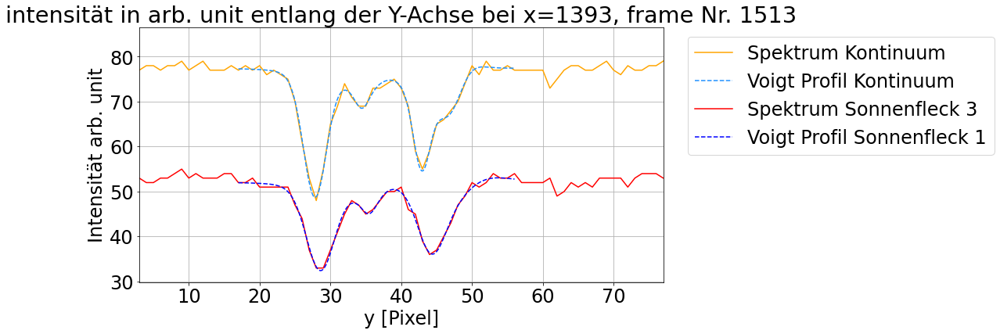

In [573]:
fig, ax = plt.subplots(figsize=(12, 6))
ax = plot_fit_function(ax, left_lim, right_lim, fit_function, popt_continuum, average_spectrum_continuum, params_spectrum, color_spectrum='orange', color_fit='dodgerblue', label_fit='Voigt Profil Kontinuum', label_spectrum='Spektrum Kontinuum')
ax = plot_fit_function(ax, left_lim, right_lim, fit_function, popt_sunspot, average_spectrum_sunspot, params_spectrum, label_fit='Voigt Profil Sonnenfleck 1', label_spectrum='Spektrum Sonnenfleck 3')
ax.grid()
ax.legend(loc='upper right', bbox_to_anchor=(1.65, 1))
plt.show()

In [574]:
# Parameter für die Korrektur der Krümmung der Fe-Linien 
polynom_params =[-1.0972553837550245E-10,1.810417883029113E-5,-0.04261111104557812,52.42003944835383]
B_z, uB_z = calcB(polynom_params, params_spectrum['x_value'], 1365, popt_continuum, pcov_continuum, popt_sunspot, pcov_sunspot)
print(f"\nDurchschnitt: B_z = {B_z.mean().round().astype(int)} ± {uB_z.mean().round(0).astype(int)} Gauss")


Durchschnitt: B_z = 1404 ± 448 Gauss


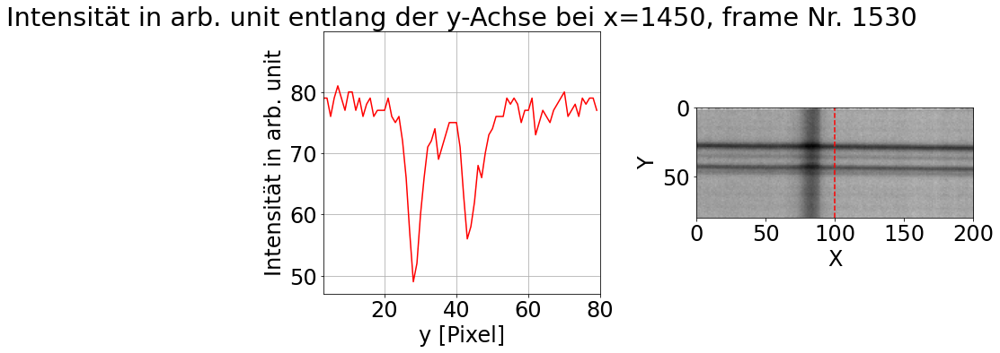

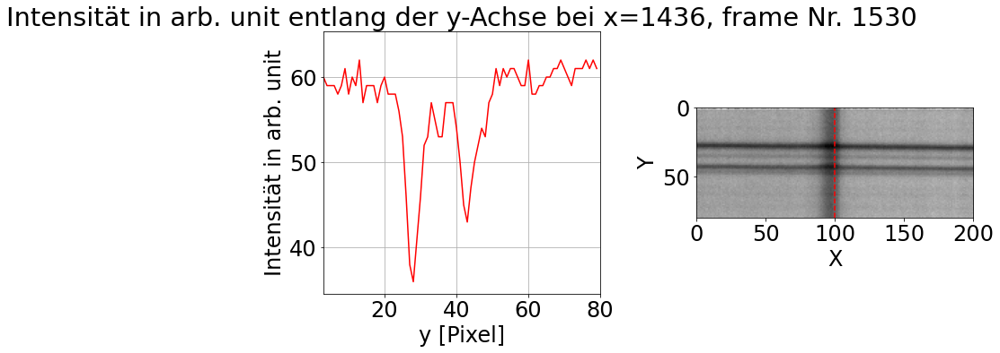

In [575]:
params_spectrum['frame_index'] = 1530
params_spectrum['x_value'] = 1450
# plotten des Bildabschnitts und des gemittelten Spektrums im Bereich der Sonnenflecken
#image = extract_single_frame(params_spectrum)
image = cv2.cvtColor(cv2.imread('Abbildungen/'+params_spectrum['file_path']+'_'+str(params_spectrum['frame_index'])+'.png'), cv2.COLOR_BGR2GRAY)
average_spectrum_continuum = get_spectrum(image, params_spectrum)
# als erstes mit vertikaler Line, an der Position an dem das Kontinuumspektrum entnommen wird
plot_spectrum(average_spectrum_continuum, image, params_spectrum)
params_spectrum['x_value'] = 1436
average_spectrum_sunspot =  get_spectrum(image, params_spectrum)
# jetzt mit vertikaler Line, an der Position an dem das Sonnenfleckspektrum von Sonnenfleck 2 entnommen wird
plot_spectrum(average_spectrum_sunspot, image, params_spectrum)

In [576]:
left_lim, right_lim = 14, 61
init_guesses_for_fit['base_intensity'] = 80
init_guesses_for_fit['amplitude_1'] = 30
init_guesses_for_fit['λ_0_3'] = 43
init_guesses_for_fit['λ_0_4'] = 48
init_guesses_for_fit['base_intensity'] = 80

popt_continuum, pcov_continuum = curve_fit(fit_function, np.arange(left_lim, right_lim), average_spectrum_continuum[left_lim:right_lim], p0=list(init_guesses_for_fit.values()))
init_guesses_for_fit['base_intensity'] = 59
init_guesses_for_fit['λ_0_3'] = 42

init_guesses_for_fit['amplitude_3'] = 26

popt_sunspot, pcov_sunspot = curve_fit(fit_function, np.arange(left_lim, right_lim), average_spectrum_sunspot[left_lim:right_lim], p0=list(init_guesses_for_fit.values()))

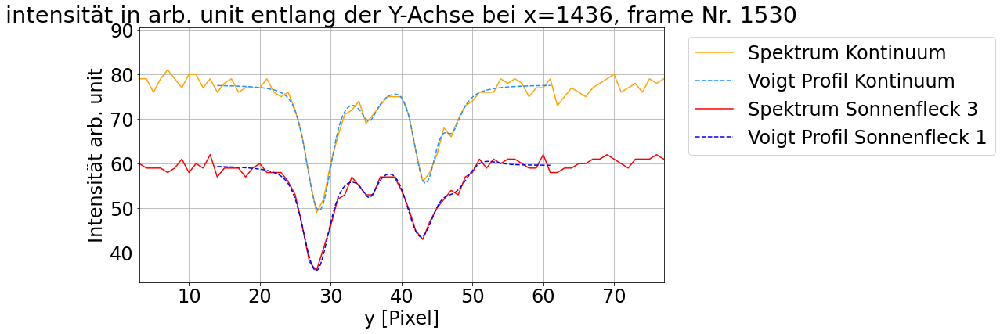

In [577]:
fig, ax = plt.subplots(figsize=(12, 6))
ax = plot_fit_function(ax, left_lim, right_lim, fit_function, popt_continuum, average_spectrum_continuum, params_spectrum, color_spectrum='orange', color_fit='dodgerblue', label_fit='Voigt Profil Kontinuum', label_spectrum='Spektrum Kontinuum')
ax = plot_fit_function(ax, left_lim, right_lim, fit_function, popt_sunspot, average_spectrum_sunspot, params_spectrum, label_fit='Voigt Profil Sonnenfleck 1', label_spectrum='Spektrum Sonnenfleck 3')
ax.grid()
ax.legend(loc='upper right', bbox_to_anchor=(1.65, 1))
plt.show()

In [578]:
# hier wir die Korrektur für die Krümmung der Fe-Linien berechnet
polynom_params =[-5.163038615775643E-11,1.792144524138044E-5,-0.04251891990413062,52.499209026585994]

B_z, uB_z = calcB(polynom_params, 1450, params_spectrum['x_value'], popt_continuum, pcov_continuum, popt_sunspot, pcov_sunspot)

print(f"\nDurchschnitt: B_z = {B_z.mean().round().astype(int)} ± {uB_z.mean().round(0).astype(int)} Gauss")


Durchschnitt: B_z = 1054 ± 411 Gauss


### Einzelner großer Sonnenfleck in der Sonnenmitte

Im Folgenden wird Sonnenfleck 3 betrachtet, zuerst mit der Aufnahmen mit link zirkular polarisiertem Licht, dann mit rechts zirkular polarisiertem Licht.

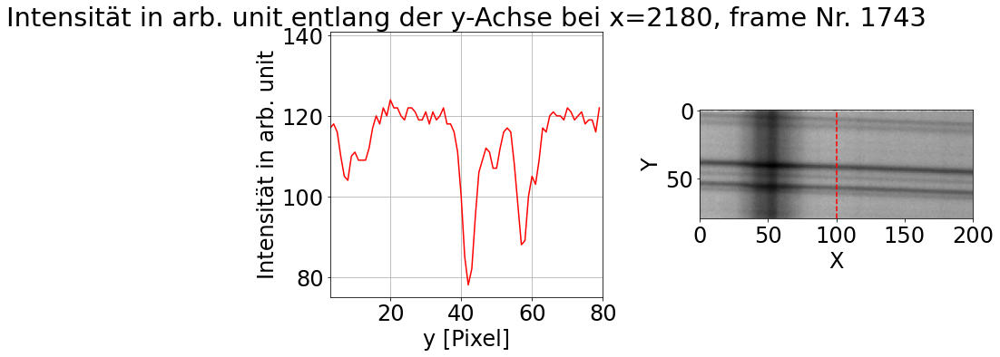

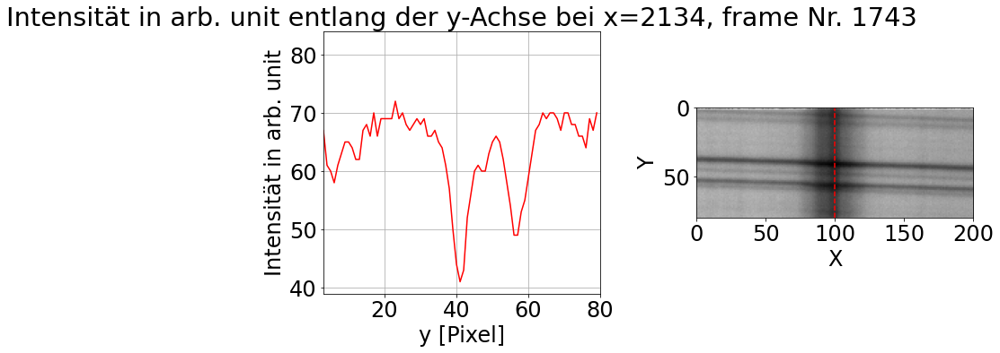

In [579]:
# Als erstes wird das Frame eingelesen
params_spectrum = {'file_path': 'fe_linie_links',
            'frame_index' : 1743,
            'x_value' : 2180, 
            'range_averaging' : 0, # Anzahl der Pixel in x-Richtung über die das Spektrum gemittelt wird
            'range_plot_image' : 100,
            'lambda_0' : 6301.5,
            'pixel_size' : 0.065 # Die Größe eines Pixels beträgt bei der Messung 0.065 Å

        }

# plotten des Bildabschnitts und des gemittelten Spektrums im Bereich der Sonnenflecken
#image = extract_single_frame(params_spectrum)
image = cv2.cvtColor(cv2.imread('Abbildungen/'+params_spectrum['file_path']+'_'+str(params_spectrum['frame_index'])+'.png'), cv2.COLOR_BGR2GRAY)
average_spectrum_continuum = get_spectrum(image, params_spectrum)
# als erstes mit vertikaler Line, an der Position an dem das Kontinuumspektrum entnommen wird
plot_spectrum(average_spectrum_continuum, image, params_spectrum)

params_spectrum['x_value'] = 2134
average_spectrum_sunspot =  get_spectrum(image, params_spectrum)
# jetzt mit vertikaler Line, an der Position an der das Sonnenfleckspektrum von Sonnenfleck 2 entnommen wird
plot_spectrum(average_spectrum_sunspot, image, params_spectrum)

In [580]:
# jetzt wird gefittet
init_guesses_for_fit = {
    'λ_0_1' : 41, 'γ_1' : 0.7, 'σ_1' : 1.1, 'amplitude_1' : 38,
    'λ_0_2' : 45, 'γ_2' : 0.4, 'σ_2' : 0.8, 'amplitude_2' : 10,
    'λ_0_3' : 58, 'γ_3' : 1.3, 'σ_3' : 2, 'amplitude_3' : 30,
    'λ_0_4' : 61, 'γ_4' : 1.1, 'σ_4' : 0.5, 'amplitude_4' : 20,
    'base_intensity' : 120
}

fit_function = generate_voigt_sum_function(4)

left_lim, right_lim = 30, 72

# Fit für das Spektrum in Kontinuum
popt_continuum, pcov_continuum = curve_fit(fit_function, np.arange(left_lim, right_lim), average_spectrum_continuum[left_lim:right_lim], p0=list(init_guesses_for_fit.values()))
init_guesses_for_fit['base_intensity'] = 70
init_guesses_for_fit['λ_0_4'] = 60
init_guesses_for_fit['λ_0_2'] = 47
# Fit für das Spektrum von Sonnenfleck 2
popt_sunspot, pcov_sunspot = curve_fit(fit_function, np.arange(left_lim, right_lim), average_spectrum_sunspot[left_lim:right_lim], p0=list(init_guesses_for_fit.values()))

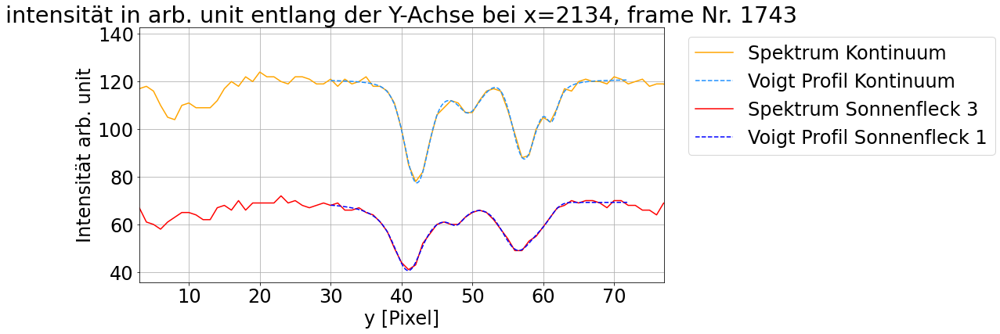

In [581]:
fig, ax = plt.subplots(figsize=(12, 6))
ax = plot_fit_function(ax, left_lim, right_lim, fit_function, popt_continuum, average_spectrum_continuum, params_spectrum, color_spectrum='orange', color_fit='dodgerblue', label_fit='Voigt Profil Kontinuum', label_spectrum='Spektrum Kontinuum')
ax = plot_fit_function(ax, left_lim, right_lim, fit_function, popt_sunspot, average_spectrum_sunspot, params_spectrum, label_fit='Voigt Profil Sonnenfleck 1', label_spectrum='Spektrum Sonnenfleck 3')
ax.grid()
ax.legend(loc='upper right', bbox_to_anchor=(1.65, 1))
plt.show()

In [582]:
# hier wir die Korrektur für die Krümmung der Fe-Linien berechnet
polynom_params =[-1.803348659644562E-10,1.854316026210575E-5,-0.04299527717135918,49.558172131527265]
B_z, uB_z = calcB(polynom_params, 2180, params_spectrum['x_value'], popt_continuum, pcov_continuum, popt_sunspot, pcov_sunspot)
print(f"\nDurchschnitt: B_z = {B_z.mean().round().astype(int)} ± {uB_z.mean().round(0).astype(int)} Gauss")



Durchschnitt: B_z = 4546 ± 320 Gauss


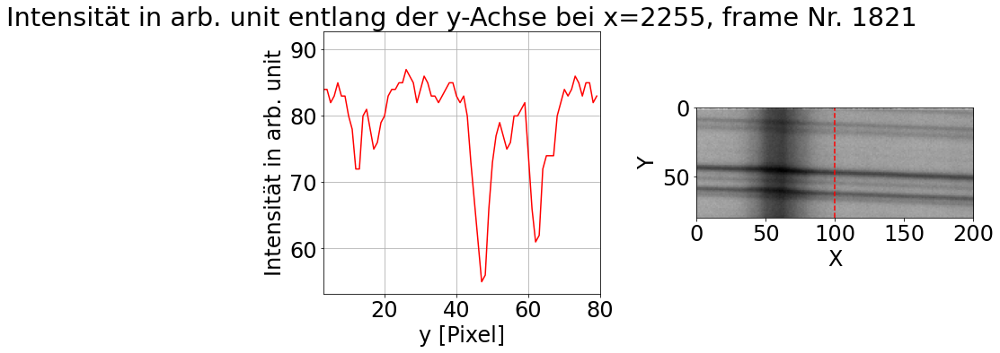

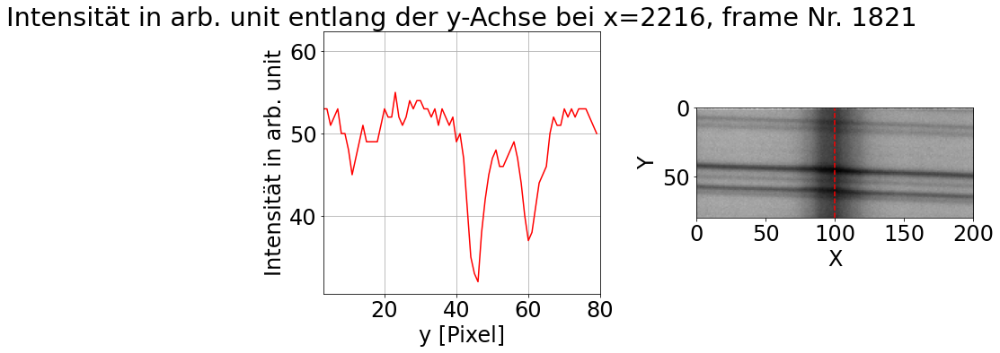

In [583]:
# Als erstes wird das Frame eingelesen
params_spectrum = {'file_path': 'fe_linie_rechts',
            'frame_index' : 1821,
            'x_value' : 2255, 
            'range_averaging' : 0, # Anzahl der Pixel in x-Richtung über die das Spektrum gemittelt wird
            'range_plot_image' : 100,
            'lambda_0' : 6301.5,
            'pixel_size' : 0.065 # Die Größe eines Pixels beträgt bei der Messung 0.065 Å
        }

# plotten des Bildabschnitts und des gemittelten Spektrums im Bereich der Sonnenflecken
#image = extract_single_frame(params_spectrum)
image = cv2.cvtColor(cv2.imread('Abbildungen/'+params_spectrum['file_path']+'_'+str(params_spectrum['frame_index'])+'.png'), cv2.COLOR_BGR2GRAY)
average_spectrum_continuum = get_spectrum(image, params_spectrum)
# als erstes mit vertikaler Line, an der Position an dem das Kontinuumspektrum entnommen wird
plot_spectrum(average_spectrum_continuum, image, params_spectrum)
params_spectrum['x_value'] = 2216
average_spectrum_sunspot =  get_spectrum(image, params_spectrum)
# jetzt mit vertikaler Line, an der Position an der das Sonnenfleckspektrum von Sonnenfleck 3 entnommen wird
plot_spectrum(average_spectrum_sunspot, image, params_spectrum)

In [584]:
# jetzt wird gefittet
init_guesses_for_fit = {
    'λ_0_1' : 44, 'γ_1' : 0.7, 'σ_1' : 1.1, 'amplitude_1' : 25,
    'λ_0_2' : 45, 'γ_2' : 0.4, 'σ_2' : 0.8, 'amplitude_2' : 10,
    'λ_0_3' : 62, 'γ_3' : 1.3, 'σ_3' : 2, 'amplitude_3' : 30,
    'λ_0_4' : 64, 'γ_4' : 1.1, 'σ_4' : 0.5, 'amplitude_4' : 10,
    'base_intensity' : 83
}
left_lim, right_lim = 34, 76

# Fit für das Spektrum in Kontinuum
popt_continuum, pcov_continuum = curve_fit(fit_function, np.arange(left_lim, right_lim), average_spectrum_continuum[left_lim:right_lim], p0=list(init_guesses_for_fit.values()))
init_guesses_for_fit['base_intensity'] = 53
init_guesses_for_fit['amplitude_1'] = 28
init_guesses_for_fit['amplitude_4'] = 10
init_guesses_for_fit['λ_0_3'] = 60
init_guesses_for_fit['λ_0_4'] = 61

# Fit für das Spektrum von Sonnenfleck 3
popt_sunspot, pcov_sunspot = curve_fit(fit_function, np.arange(left_lim, right_lim), average_spectrum_sunspot[left_lim:right_lim], p0=list(init_guesses_for_fit.values()))

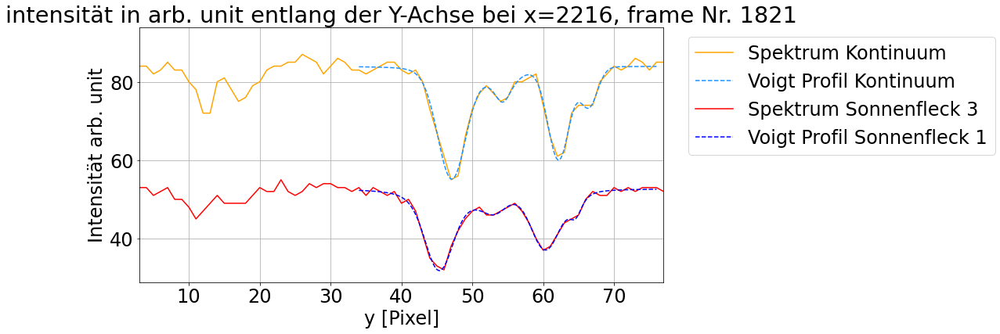

In [585]:
fig, ax = plt.subplots(figsize=(12, 6))
ax = plot_fit_function(ax, left_lim, right_lim, fit_function, popt_continuum, average_spectrum_continuum, params_spectrum, color_spectrum='orange', color_fit='dodgerblue', label_fit='Voigt Profil Kontinuum', label_spectrum='Spektrum Kontinuum')
ax = plot_fit_function(ax, left_lim, right_lim, fit_function, popt_sunspot, average_spectrum_sunspot, params_spectrum, label_fit='Voigt Profil Sonnenfleck 1', label_spectrum='Spektrum Sonnenfleck 3')
ax.grid()
ax.legend(loc='upper right', bbox_to_anchor=(1.65, 1))
plt.show()

In [586]:
# hier wir die Korrektur für die Krümmung der Fe-Linien berechnet
polynom_params = [2.4262258412246474E-11,1.7535759899970135E-5,-0.041954689790762764,52.07726454366975]
B_z, uB_z = calcB(polynom_params, 2255, params_spectrum['x_value'], popt_continuum, pcov_continuum, popt_sunspot, pcov_sunspot)
print(f"\nDurchschnitt: B_z = {B_z.mean().round().astype(int)} ± {uB_z.mean().round(0).astype(int)} Gauss")


Durchschnitt: B_z = 4038 ± 307 Gauss


Im Folgenden sind noch einmal die Ergebnisse zur Berechnung der magnetischen Feldstärke zusammengefasst:
$$
\begin{array}{|c|c|c|c|}
\hline
\text{Sonnenfleck}& \text{Sonnenfleck 1} & \text{Sonnenfleck 2} & \text{Sonnenfleck 3}  \\
\hline
\langle\text{B}_{\text{z}}\rangle \,\text{links Polarisiert}\, [\rm{Gauss}]& 1742 \pm 409 &   1299 \pm 366  &  4546 \pm 320  \\
\hline
\langle\text{B}_{\text{z}}\rangle \,\text{rechts Polarisiert} \,[\rm{Gauss}] & 1404 \pm 448 & 1054 \pm 411  &  4038 \pm 307 \\
\hline
\langle\text{B}_{\text{z}}\rangle \,\text{Durchschnitt} \,[\rm{Gauss}] & 1573 \pm 429 & 1177 \pm 389  &  4292 \pm 314 \\
\hline
\end{array}
$$.
Wie man sieht unterscheiden sich die Werte der berechneten magnetischen Feldstärke für links und rechts polarisiertes Licht. Diese Abweichung könnte eventell dadurch zustande kommen, dass die x-position, an der das Spektrum für den Sonnenfleck entnommen wurde nur grob mit dem Auge bestimmt wurde. Deshalb wäre es möglich, dass bei manchen Messungen das Spektrum nicht perfekt an dem Punkt des Sonnenflecks entnommen wurde, an dem das Magnetfeld und somit die Verschiebung der Fe-Linie am größten ist. 

Man erkennt, dass für den Sonnenfleck 3, welcher relativ groß ist, die magnetische Feldstärke deutlich größer ist als für die kleineren Sonnenflecken 1 und 2. Die Werte der Magnetischen Feldstärken im Bereich weniger kilo Gauss erscheinen realistisch für Sonnenflecken.


# Zusammenfassung

Der Versuchsaufbau ermöglichte die erfolgreiche Beobachtung verschiedener Strukturen auf der Sonne, darunter Sonnenflecken, Filamente, Protuberanzen und Sonnenfackeln. Dabei zeigte sich, dass diese Strukturen nur bei bestimmten Wellenlängen sichtbar sind und bei größeren Abweichungen von diesen Wellenlängen verschwinden. Die Höhe von zwei Protuberanzen wurde präzise bestimmt, mit Werten von $29970 \pm 1776, \text{km}$ und $47186 \pm 1972\, \text{km}$. Des weiteren wurden zwei Filamente vermessen, deren Längen $(1,01 \pm 0,17) \cdot 10^{5} \text{ km}$ und $(1,79 \pm 0,19) \cdot 10^{5}\,\text{km}$ betrugen. Die Rotationsrichtung der Sonne konnte durch die Auswertung eines Dopplergramms ermittelt werden, und die Rotationsgeschwindigkeit wurde mit $1767 \pm 253, \text{m/s}$ bestimmt, was in guter Übereinstimmung mit dem Literaturwert von $1,7, \text{km/s}$ steht. Zudem konnte durch die Analyse eines Magnetogramms die Stärke und Ausrichtung des Magnetfeldes in den Bereichen der Sonnenflecken ermittelt werden. Die Magnetfeldstärke in den Sonnenflecken, die durch die Zeeman-Aufspaltung der Fe-Linie in longitudinaler Richtung bestimmt wurde, zeigte Werte zwischen 1 und 4 Gauss.

# Literatur

http://www.astrosurf.com/rondi/obs/shg/magnetogram_anglais.htm

http://www.astrosurf.com/solex/sol-ex-observation-en.html

https://doi.org/10.1119/1.17119

https://doi.org/10.1007/978-3-642-37700-6

http://www.lightfrominfinity.org/Libro%20Spettroeliografia%20digitale%20testo%20inglese/English%20Text.pdf

https://solarnutcase.livejournal.com/9556.html